# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Pipeline development

In [8]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import collections
%matplotlib inline

## Camera calibration

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
#     plt.imshow(img)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [3]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

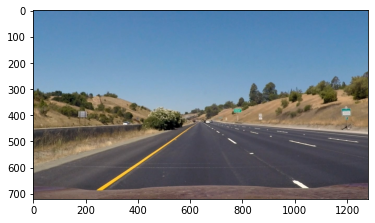

In [4]:
img = mpimg.imread('test_images/straight_lines1.jpg')
nx = 9 
ny = 6 
plt.imshow(img)

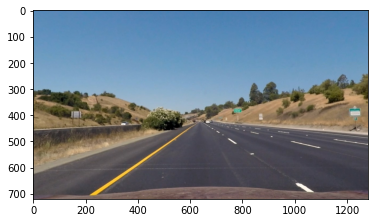

In [5]:
def undistort(img):
    img = cv2.undistort(img, mtx, dist, None, mtx)
    return img

img = undistort(img)
plt.imshow(img)
plt.show()

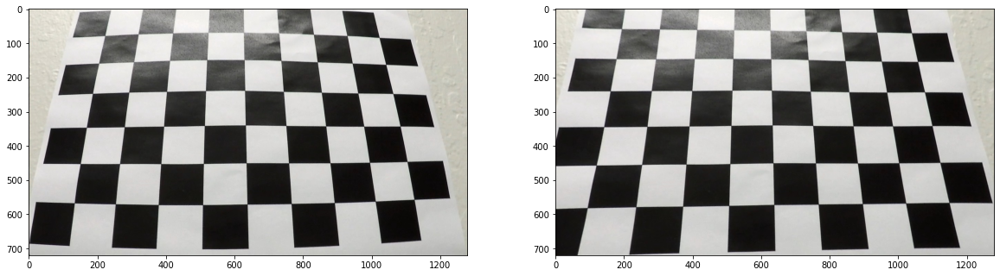

In [6]:
calib_img = mpimg.imread('camera_cal/calibration3.jpg')
calib_img_after = undistort(calib_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(calib_img)
ax2.imshow(calib_img_after)
plt.show()

f.savefig('output_images/' + 'calib' + '_result.jpg')

## Thresholding to creat binary mask

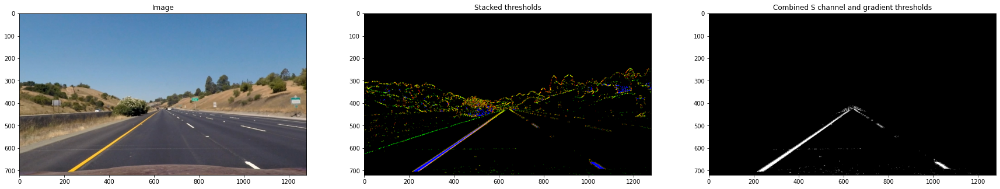

In [9]:
def thresholding(img):
    img_shape = img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)

    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))

    sobel_mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobelmag = np.uint8(255*sobel_mag/np.max(sobel_mag))

    sobel_dir = np.arctan2(abs_sobely, abs_sobelx)

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    thresh_min_x = 20
    thresh_max_x = 100
    xbinary = np.zeros_like(scaled_sobelx)
    xbinary[(scaled_sobelx >= thresh_min_x) & (scaled_sobelx <= thresh_max_x)] = 1

    thresh_min_y = 20
    thresh_max_y = 100
    ybinary = np.zeros_like(scaled_sobely)
    ybinary[(scaled_sobely >= thresh_min_y) & (scaled_sobely <= thresh_max_y)] = 1

    thresh_min_m = 30
    thresh_max_m = 100
    mbinary = np.zeros_like(scaled_sobelmag)
    mbinary[(scaled_sobelmag >= thresh_min_m) & (scaled_sobelmag <= thresh_max_m)] = 1

    thresh_min_d = 0.7
    thresh_max_d = 1.3
    dbinary = np.zeros_like(sobel_dir)
    dbinary[(sobel_dir >= thresh_min_d) & (sobel_dir <= thresh_max_d)] = 1

    thresh_mins = 170
    thresh_maxs = 255
    sbinary = np.zeros_like(s_channel)
    sbinary[(s_channel >= thresh_mins) & (s_channel <= thresh_maxs)] = 1
    

    combined = np.zeros_like(gray)
    combined[((xbinary == 1) & (ybinary == 1)) | ((mbinary == 1) & (dbinary == 1)) | sbinary == 1] = 1
    
    ignore_mask_color = 255
    vertices = np.array([[(70,img_shape[0]),(img_shape[1]//2 -10, img_shape[0]//2 + 50), (img_shape[1]//2 + 10, img_shape[0]//2 + 50), (img_shape[1]-70,img_shape[0])]], dtype=np.int32)
    mask = np.zeros_like(combined)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    combined = cv2.bitwise_and(combined, mask)

    color_binary = np.dstack(( ((xbinary == 1) & (ybinary == 1)),
                              ((mbinary == 1) & (dbinary == 1)),
                              sbinary)) * 255
    return color_binary, combined

color_binary, combined = thresholding(img)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,10))

ax1.set_title('Image')
ax1.imshow(img)

ax2.set_title('Stacked thresholds')
ax2.imshow(color_binary)

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(combined, cmap='gray')
plt.show()

## Perspective transformation

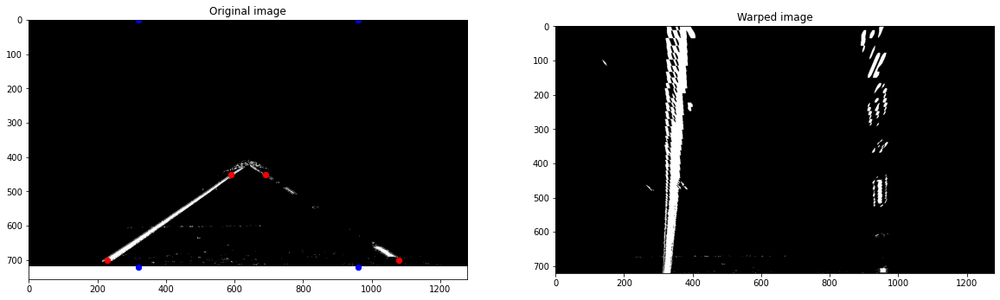

In [10]:
def perspective_transform(combined):
#     src = np.float32([[570,470],[230,700],[1080,700],[720,470]])
#     dst = np.float32([[320,0],[320,720],[960,720],[960,0]])
    src = np.float32([[590,450],[230,700],[1080,700],[690,450]])
    dst = np.float32([[320,0],[320,720],[960,720],[960,0]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(combined, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

    return warped, M, Minv

warped, M, Minv = perspective_transform(combined)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('Original image')
ax1.imshow(combined, cmap='gray')
ax1.scatter(x=[590, 230, 1080, 690], y=[450, 700, 700, 450], c='r', s=40)
ax1.scatter(x=[320, 320, 960, 960], y=[0, 720, 720, 0], c='b', s=40)

ax2.set_title('Warped image')
ax2.imshow(warped, cmap='gray')

# plt.savefig('test_images_output/' + 'prespective' + '_result.jpg')

## Fit polynomial line

In [11]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        self.history_len = 10
        
        self.failed_attempts = 0
        # was the line detected in the last iteration
        self.detected = False  
        # x values of the last n fits of the line
        self.xfitted = collections.deque(maxlen=self.history_len) 
        #polynomial coefficients over the last n iterations
        self.fits = collections.deque(maxlen=self.history_len) 
        #radius of curvature of the line in some units
        self.radius_of_curvature = collections.deque(maxlen=self.history_len) 
        #distance in meters of vehicle center from the line
        self.line_base_pos = collections.deque(maxlen=self.history_len)  

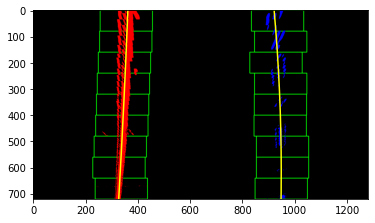

In [13]:
left, right = Line(), Line()

def fit_new_line(binary_warped, left, right, plot = False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        # Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    if plot:
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]
        plt.imshow(out_img)
        
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit, left_fitx, right_fit


out_img, left_fit, right_fit, left_fitx, right_fit = fit_new_line(warped, left, right, plot = True)

# plt.savefig('output_images/' + 'poly_fit_1' + '_result.jpg')

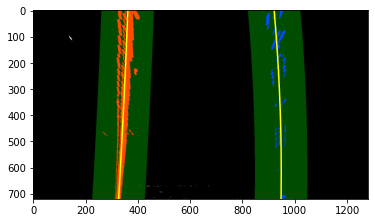

In [14]:
left.fits.append(left_fit)
right.fits.append(right_fit)

def update_line(binary_warped, left, right, plot = False):
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    left_lane_inds = ((nonzerox > (left.fits[0][0]*(nonzeroy**2) + left.fits[0][1]*nonzeroy + 
                    left.fits[0][2] - margin)) & (nonzerox < (left.fits[0][0]*(nonzeroy**2) + 
                    left.fits[0][1]*nonzeroy + left.fits[0][2] + margin)))
    right_lane_inds = ((nonzerox > (right.fits[0][0]*(nonzeroy**2) + right.fits[0][1]*nonzeroy + 
                    right.fits[0][2] - margin)) & (nonzerox < (right.fits[0][0]*(nonzeroy**2) + 
                    right.fits[0][1]*nonzeroy + right.fits[0][2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    
    if plot:
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Plot the polynomial lines onto the image
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        
    
    return out_img, left_fit, right_fit, left_fitx, right_fitx

# Run image through the pipeline
out_img, left_fit, right_fit, left_fitx, right_fitx = update_line(warped, left, right, plot = True)

# plt.savefig('output_images/' + 'poly_fit_2' + '_result.jpg')

In [15]:
def compute_curv_offset(warped, left_fit, right_fit):
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700  # meters per pixel in x dimension

    y_eval = warped.shape[0] // 2

    left_curv = ((1 + (2*left_fit[0] * (xm_per_pix/(ym_per_pix**2))*y_eval + left_fit[1]* (xm_per_pix/ym_per_pix))**2)**1.5) / np.absolute(2*left_fit[0]*(xm_per_pix/(ym_per_pix**2)))
    right_curv = ((1 + (2*right_fit[0] * (xm_per_pix/(ym_per_pix**2))*y_eval + right_fit[1]* (xm_per_pix/ym_per_pix))**2)**1.5) / np.absolute(2*right_fit[0]*(xm_per_pix/(ym_per_pix**2)))

    radius = np.mean([left_curv, right_curv])

    left_lane = left_fit[0]*(y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane = right_fit[0]*(y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    
    left_top = left_fit[0]*(0)**2 + left_fit[1]*0 + left_fit[2]
    right_top = right_fit[0]*(0)**2 + right_fit[1]*0 + right_fit[2]
    left_bot = left_fit[0]*(warped.shape[0])**2 + left_fit[1]*warped.shape[0] + left_fit[2]
    right_bot = right_fit[0]*(warped.shape[0])**2 + right_fit[1]*warped.shape[0] + right_fit[2]

    offset = (warped.shape[1]//2 - np.mean([left_lane, right_lane]))*xm_per_pix

    return radius, offset, left_curv, right_curv, (right_top - left_top) * xm_per_pix, (right_bot - left_bot) * xm_per_pix


radius, offset, left_curv, right_curv, top_dis, bot_dis = compute_curv_offset(warped, left_fit, right_fit)

print(radius, offset, left_curv, right_curv, top_dis, bot_dis)

6725.443953685548 -0.025824524220765237 11076.9228585119 2373.965048859196 2.956875273260264 3.281826943576501


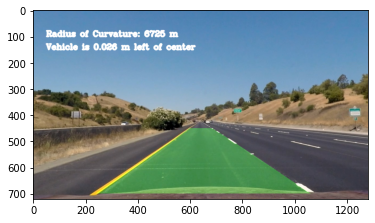

In [573]:
def overlay_results(img, warped, Minv, left_fit, right_fit, radius, offset):
    out_img = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((out_img, out_img, out_img))

    # Create road polygon
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    pts_left = np.array([np.transpose(np.vstack([leftx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    warp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 

    # Combine the result with the original image
    out_img = cv2.addWeighted(img.copy(), 1, warp, 0.3, 0)

    cv2.putText(out_img, 'Radius of Curvature: {} m'.format(round(radius)), (50, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 6)
    cv2.putText(out_img, 'Vehicle is {} m {} of center'.format(abs(round(offset, 3)), 'right' if offset > 0 else 'left'), (50, 150), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 6)
    
    return out_img

out_img = overlay_results(img, warped, Minv, left_fit, right_fit, radius, offset)

plt.imshow(out_img)

plt.savefig('output_images/' + 'poly_fit_1' + '_result.jpg')

# Test on images

In [548]:
def process_image(image, plot = True):
    
    global frame, left, right
    
    # undistorting
    img = undistort(image)

    # binary thresholding
    _, combined = thresholding(img)
    
    # perspective transform
    warped, M, Minv = perspective_transform(combined)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

        ax1.set_title('Binary image')
        ax1.imshow(combined, cmap='gray')


    # fit polynomial line
    if frame == 0 or left.detected == False or right.detected == False:
        out_img, left_fit, right_fit, left_fitx, right_fit = fit_new_line(warped, left, right, plot = plot)    
    else:
        out_img, left_fit, right_fit, left_fitx, right_fitx = update_line(warped, left, right, plot = plot)

    # calculate curveture and offset
    radius, offset, left_curv, right_curv, top_dis, bot_dis = compute_curv_offset(warped, left_fit, right_fit)
    
    if plot:
        ax2.set_title('l_curv: {:4.0f} r_curv: {:4.0f} top_d: {:4.2f} bot_d: {:4.2f}'.format(left_curv, right_curv, top_dis, bot_dis))
    
    offset_past = np.mean(left.line_base_pos, axis=0)
    radius_past = np.mean(left.radius_of_curvature, axis=0)
    
    # sanity checks
    if frame != 0 and \
        ((abs(left_curv - right_curv)/left_curv > 2 and left_curv < 2000 and right_curv < 2000)
         or abs(top_dis - bot_dis) > 0.5
         or top_dis > 4
         or bot_dis > 4
         or abs(offset - offset_past)/offset_past > 1
         or abs(radius - radius_past)/radius_past > 2
        ):
        left.detected = False
        left.failed_attempts += 1
        right.detected = False
        right.failed_attempts += 1
#         print('frame: ', frame)
#         if abs(offset - offset_past)/offset_past > 2:
#             print('offset history mismatch')
#         if abs(radius - radius_past)/radius_past > 2:
#             print('radius history mismatch')
#         if abs(left_curv - right_curv)/left_curv > 2 and left_curv < 2000 and right_curv < 2000:
#             print('radius left/right mismatch')
#         if abs(top_dis - bot_dis) > 0.5:
#             print('parallel mismatch')
    else:
        left.detected = True
        left.failed_attempts = 0
        left.fits.append(left_fit)
        left.radius_of_curvature.append(radius)
        left.line_base_pos.append(offset)
        
        right.detected = True
        right.failed_attempts = 0
        right.fits.append(right_fit)
        right.radius_of_curvature.append(radius)
        right.line_base_pos.append(offset)
    
    # display results on top of original image
    final_img = overlay_results(img, warped, Minv, 
                                np.mean(left.fits, axis=0), 
                                np.mean(right.fits, axis=0),
                                np.mean(left.radius_of_curvature, axis=0),
                                np.mean(left.line_base_pos, axis=0))
    
    
    frame += 1
    
    return final_img

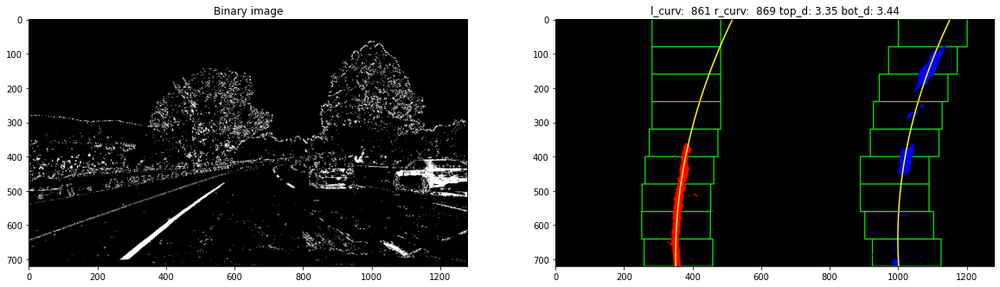

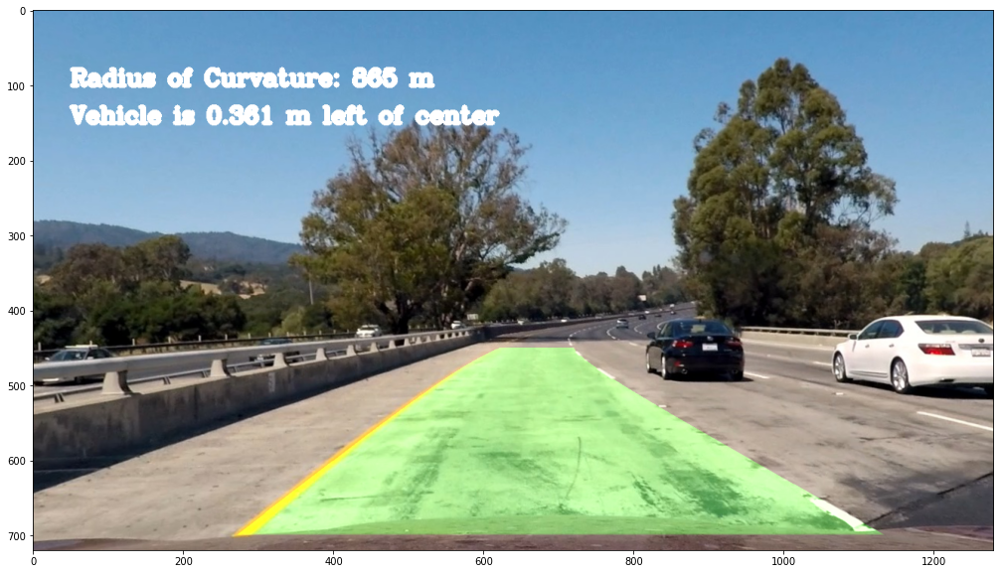

In [465]:
frame = 0
left, right = Line(), Line()
final_img = process_image(img)
f, ax = plt.subplots(1, 1, figsize=(20,10))
ax.imshow(final_img)

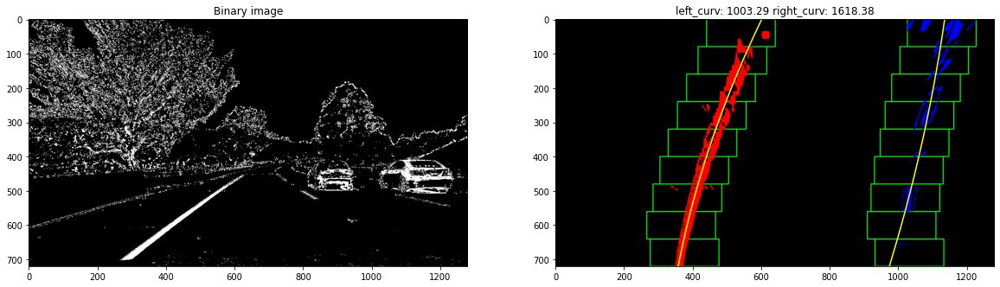

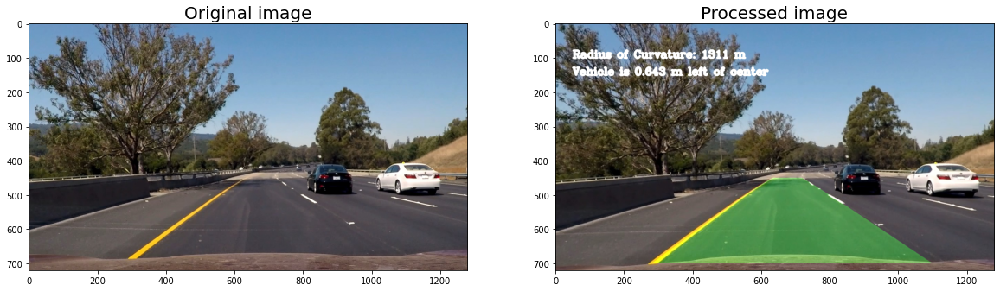

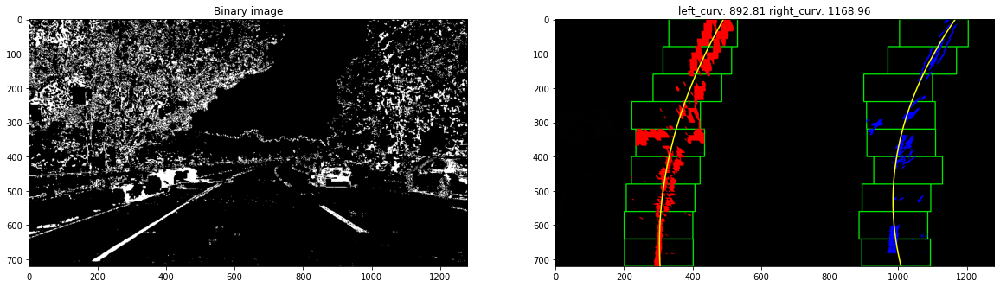

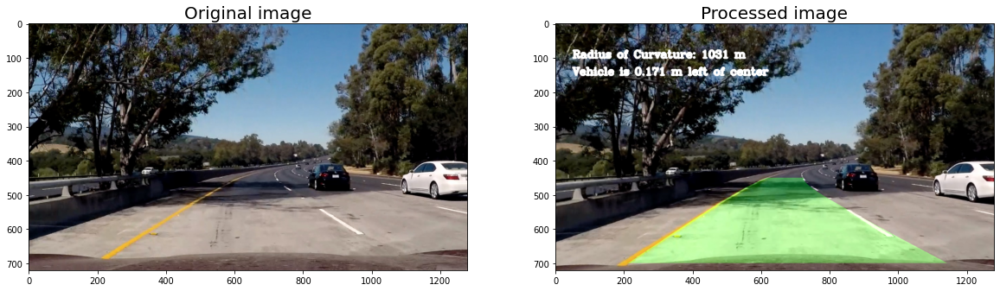

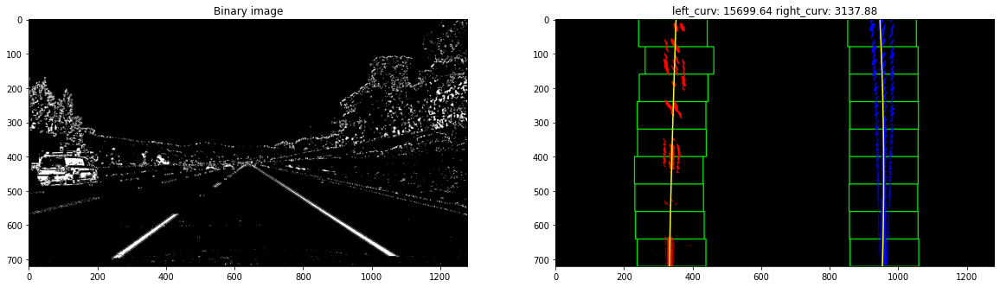

...

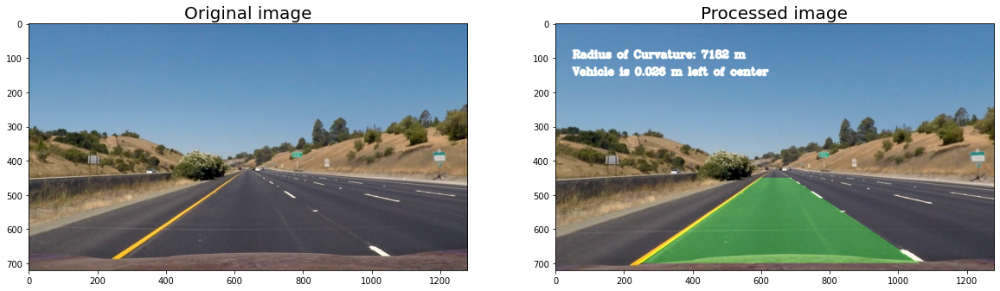

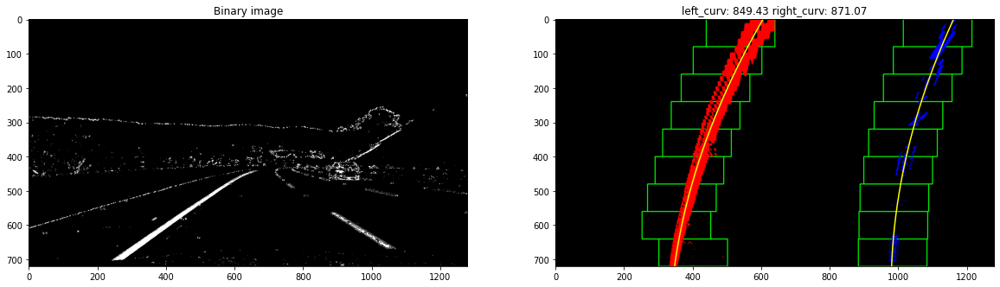

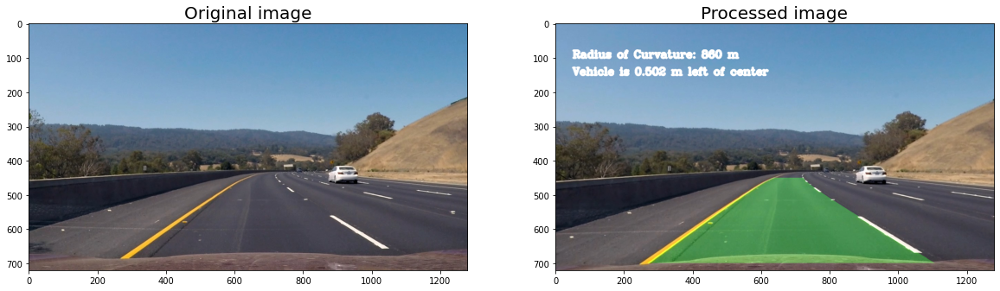

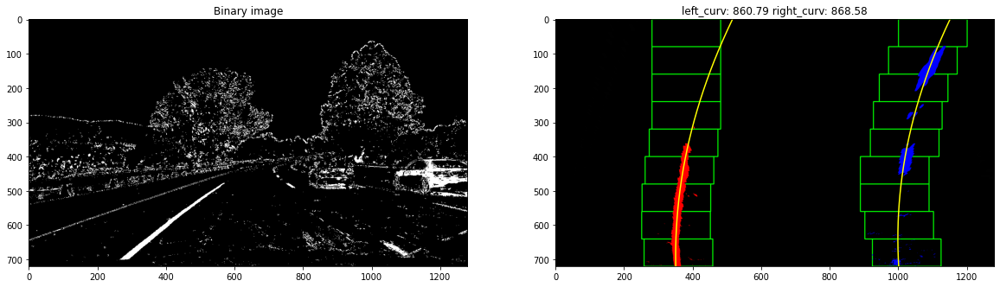

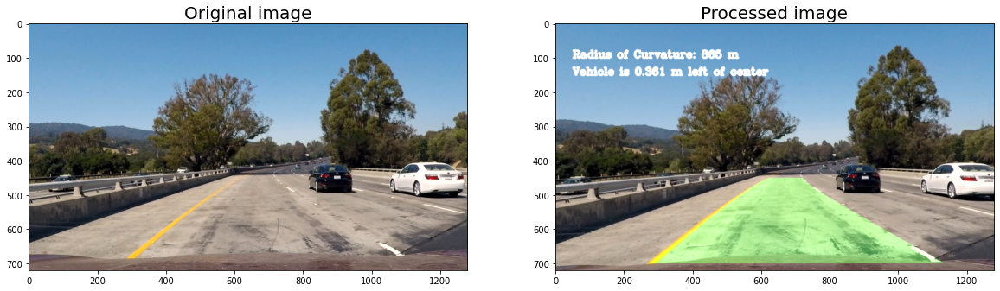

In [455]:
for img_file in glob.glob("test_images/*.jpg"):

    img = mpimg.imread(img_file)
    
    frame = 0
    left, right = Line(), Line()
    
    final_img = process_image(img)
        
    f, (ax1, ax2,) = plt.subplots(1, 2, figsize=(20,10))

    ax1.set_title('Original image', fontsize=20)
    ax1.imshow(img)

    ax2.set_title('Processed image', fontsize=20)
    ax2.imshow(final_img, cmap='gray')

    
#     plt.savefig('test_images_output/' + img_file[12:-4] + '_result.jpg')


# Test on videos

In [580]:
def process_image(image, plot = True):
    
    global frame, left, right
    
    # undistorting
    img = undistort(image)

    # binary thresholding
    _, combined = thresholding(img)
    
    # perspective transform
    warped, M, Minv = perspective_transform(combined)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

        ax1.set_title('Binary image')
        ax1.imshow(combined, cmap='gray')


    # fit polynomial line
    if frame == 0 or left.detected == False or right.detected == False:
        out_img, left_fit, right_fit, left_fitx, right_fit = fit_new_line(warped, left, right, plot = plot)    
    else:
        out_img, left_fit, right_fit, left_fitx, right_fitx = update_line(warped, left, right, plot = plot)

    # calculate curveture and offset
    radius, offset, left_curv, right_curv, top_dis, bot_dis = compute_curv_offset(warped, left_fit, right_fit)
    
    if plot:
        ax2.set_title('l_curv: {:4.0f} r_curv: {:4.0f} top_d: {:4.2f} bot_d: {:4.2f}'.format(left_curv, right_curv, top_dis, bot_dis))
    
    offset_past = np.mean(left.line_base_pos, axis=0)
    radius_past = np.mean(left.radius_of_curvature, axis=0)
    
    # sanity checks
    if left.failed_attempts > 10 or right.failed_attempts > 10:
        left.detected = True
        left.failed_attempts = 0
        left.fits.append(left_fit)
        left.radius_of_curvature.append(radius)
        left.line_base_pos.append(offset)
        
        right.detected = True
        right.failed_attempts = 0
        right.fits.append(right_fit)
        right.radius_of_curvature.append(radius)
        right.line_base_pos.append(offset)
        
    elif frame != 0 and \
        ((abs(left_curv - right_curv)/left_curv > 2 and left_curv < 2000 and right_curv < 2000)
         or abs(top_dis - bot_dis) > 0.5
         or top_dis > 4
         or bot_dis > 4
         or abs(offset - offset_past)/offset_past > 10
         or abs(radius - radius_past)/radius_past > 5
        ):
        left.detected = False
        left.failed_attempts += 1
        right.detected = False
        right.failed_attempts += 1
        print('frame: ', frame)
        if abs(offset - offset_past)/offset_past > 10:
            print('offset history mismatch')
        if abs(radius - radius_past)/radius_past > 5:
            print('radius history mismatch')
        if abs(left_curv - right_curv)/left_curv > 2 and left_curv < 2000 and right_curv < 2000:
            print('radius left/right mismatch')
        if abs(top_dis - bot_dis) > 0.5:
            print('parallel mismatch')
    else:
        left.detected = True
        left.failed_attempts = 0
        left.fits.append(left_fit)
        left.radius_of_curvature.append(radius)
        left.line_base_pos.append(offset)
        
        right.detected = True
        right.failed_attempts = 0
        right.fits.append(right_fit)
        right.radius_of_curvature.append(radius)
        right.line_base_pos.append(offset)
    
    # display results on top of original image
    final_img = overlay_results(img, warped, Minv, 
                                np.mean(left.fits, axis=0), 
                                np.mean(right.fits, axis=0),
                                np.mean(left.radius_of_curvature, axis=0),
                                np.mean(left.line_base_pos, axis=0))
    
    frame += 1
    
    return final_img

## project video

In [426]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [575]:
frame = 0
left, right = Line(), Line()
output = 'test_videos_output/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
# clip1 = VideoFileClip("project_video.mp4").subclip(10,15)

clip = clip1.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video test_videos_output/project_video.mp4.
Moviepy - Writing video test_videos_output/project_video.mp4



t:   1%|▏         | 17/1260 [00:01<01:39, 12.44it/s, now=None]

frame:  15
offset history mismatch
frame:  16
offset history mismatch
frame:  17
offset history mismatch
parallel mismatch


t:   2%|▏         | 21/1260 [00:01<01:47, 11.50it/s, now=None]

frame:  18
offset history mismatch
parallel mismatch
frame:  19
offset history mismatch
frame:  20
offset history mismatch


t:   2%|▏         | 23/1260 [00:01<01:47, 11.50it/s, now=None]

frame:  21
offset history mismatch
frame:  22
offset history mismatch
frame:  23
offset history mismatch


t:   2%|▏         | 27/1260 [00:02<01:45, 11.73it/s, now=None]

frame:  24
offset history mismatch
frame:  25
offset history mismatch


t:   3%|▎         | 39/1260 [00:03<01:42, 11.90it/s, now=None]

frame:  37
parallel mismatch
frame:  38
parallel mismatch
frame:  39
parallel mismatch


t:   3%|▎         | 43/1260 [00:03<01:41, 11.93it/s, now=None]

frame:  40
parallel mismatch
frame:  41
parallel mismatch


t:   5%|▍         | 57/1260 [00:04<01:41, 11.83it/s, now=None]

frame:  55
parallel mismatch
frame:  57
parallel mismatch


t:   5%|▍         | 61/1260 [00:05<01:40, 11.92it/s, now=None]

frame:  59
parallel mismatch
frame:  60
parallel mismatch
frame:  61
parallel mismatch


t:   5%|▌         | 65/1260 [00:05<01:41, 11.77it/s, now=None]

frame:  62
parallel mismatch
frame:  63
parallel mismatch
frame:  64
parallel mismatch


t:   5%|▌         | 67/1260 [00:05<01:40, 11.91it/s, now=None]

frame:  65
parallel mismatch
frame:  66
parallel mismatch
frame:  67
parallel mismatch


t:   6%|▌         | 71/1260 [00:05<01:37, 12.22it/s, now=None]

frame:  68
parallel mismatch
frame:  69
parallel mismatch


t:   6%|▌         | 73/1260 [00:06<01:36, 12.27it/s, now=None]

frame:  71
parallel mismatch
frame:  72
parallel mismatch
frame:  73
parallel mismatch


t:   6%|▌         | 77/1260 [00:06<01:37, 12.15it/s, now=None]

frame:  74
parallel mismatch
frame:  75
parallel mismatch
frame:  76
parallel mismatch


t:   7%|▋         | 83/1260 [00:06<01:38, 11.98it/s, now=None]

frame:  81
parallel mismatch
frame:  82
parallel mismatch
frame:  83
parallel mismatch


t:   7%|▋         | 89/1260 [00:07<01:38, 11.86it/s, now=None]

frame:  87
parallel mismatch
frame:  88
parallel mismatch
frame:  89
parallel mismatch


t:   7%|▋         | 93/1260 [00:07<01:39, 11.76it/s, now=None]

frame:  90
parallel mismatch
frame:  91
parallel mismatch
frame:  92
parallel mismatch


t:   8%|▊         | 95/1260 [00:07<01:38, 11.78it/s, now=None]

frame:  93
parallel mismatch
frame:  94
parallel mismatch
frame:  95
parallel mismatch


t:   8%|▊         | 99/1260 [00:08<01:37, 11.95it/s, now=None]

frame:  96
parallel mismatch
frame:  97
parallel mismatch


t:   8%|▊         | 101/1260 [00:08<01:36, 12.00it/s, now=None]

frame:  99
parallel mismatch
frame:  100
parallel mismatch


t:   8%|▊         | 105/1260 [00:08<01:35, 12.13it/s, now=None]

frame:  102
parallel mismatch
frame:  103
parallel mismatch
frame:  104
parallel mismatch


t:   9%|▉         | 117/1260 [00:09<01:31, 12.43it/s, now=None]

frame:  115
parallel mismatch
frame:  116
parallel mismatch
frame:  117
parallel mismatch


t:  10%|▉         | 121/1260 [00:10<01:32, 12.29it/s, now=None]

frame:  118
parallel mismatch
frame:  119
parallel mismatch
frame:  120
parallel mismatch


t:  10%|▉         | 123/1260 [00:10<01:33, 12.15it/s, now=None]

frame:  121
parallel mismatch
frame:  122
parallel mismatch
frame:  123
parallel mismatch


t:  10%|█         | 127/1260 [00:10<01:31, 12.34it/s, now=None]

frame:  124
parallel mismatch
frame:  125
parallel mismatch


t:  10%|█         | 129/1260 [00:10<01:32, 12.24it/s, now=None]

frame:  127
parallel mismatch
frame:  128
parallel mismatch
frame:  129
parallel mismatch


t:  11%|█         | 133/1260 [00:11<01:34, 11.97it/s, now=None]

frame:  130
parallel mismatch
frame:  131
parallel mismatch
frame:  132
parallel mismatch


t:  11%|█         | 135/1260 [00:11<01:33, 12.06it/s, now=None]

frame:  133
parallel mismatch
frame:  134
parallel mismatch
frame:  135
parallel mismatch


t:  11%|█         | 139/1260 [00:11<01:34, 11.86it/s, now=None]

frame:  136
parallel mismatch
frame:  137
parallel mismatch


t:  12%|█▏        | 145/1260 [00:12<01:34, 11.86it/s, now=None]

frame:  143
parallel mismatch
frame:  144
parallel mismatch
frame:  145
parallel mismatch


t:  12%|█▏        | 149/1260 [00:12<01:33, 11.89it/s, now=None]

frame:  146
parallel mismatch
frame:  147
parallel mismatch
frame:  148
parallel mismatch


t:  12%|█▏        | 151/1260 [00:12<01:32, 11.99it/s, now=None]

frame:  149
parallel mismatch
frame:  150
parallel mismatch
frame:  151
parallel mismatch


t:  12%|█▏        | 155/1260 [00:12<01:32, 11.94it/s, now=None]

frame:  152
parallel mismatch
frame:  153
parallel mismatch


t:  13%|█▎        | 159/1260 [00:13<01:29, 12.25it/s, now=None]

frame:  156
parallel mismatch
frame:  157
parallel mismatch
frame:  158
parallel mismatch


t:  13%|█▎        | 161/1260 [00:13<01:31, 12.08it/s, now=None]

frame:  159
parallel mismatch
frame:  160
parallel mismatch


t:  13%|█▎        | 167/1260 [00:13<01:30, 12.04it/s, now=None]

frame:  164
parallel mismatch
frame:  165
parallel mismatch
frame:  166
parallel mismatch


t:  13%|█▎        | 169/1260 [00:14<01:33, 11.69it/s, now=None]

frame:  167
parallel mismatch
frame:  168
parallel mismatch
frame:  169
parallel mismatch


t:  14%|█▍        | 175/1260 [00:14<01:30, 12.03it/s, now=None]

frame:  173
parallel mismatch
frame:  174
parallel mismatch
frame:  175
parallel mismatch


t:  14%|█▍        | 179/1260 [00:14<01:29, 12.13it/s, now=None]

frame:  176
parallel mismatch
frame:  177
parallel mismatch
frame:  178
parallel mismatch


t:  14%|█▍        | 181/1260 [00:15<01:28, 12.16it/s, now=None]

frame:  179
parallel mismatch
frame:  180
parallel mismatch
frame:  181
parallel mismatch


t:  15%|█▍        | 185/1260 [00:15<01:27, 12.30it/s, now=None]

frame:  182
parallel mismatch
frame:  183
parallel mismatch


t:  15%|█▍        | 187/1260 [00:15<01:27, 12.30it/s, now=None]

frame:  185
parallel mismatch
frame:  186
parallel mismatch
frame:  187
parallel mismatch


t:  15%|█▌        | 191/1260 [00:15<01:26, 12.34it/s, now=None]

frame:  188
parallel mismatch
frame:  189
parallel mismatch
frame:  190
parallel mismatch


t:  15%|█▌        | 193/1260 [00:16<01:27, 12.16it/s, now=None]

frame:  191
parallel mismatch
frame:  192
parallel mismatch
frame:  193
parallel mismatch


t:  16%|█▌        | 197/1260 [00:16<01:28, 11.95it/s, now=None]

frame:  194
parallel mismatch
frame:  195
parallel mismatch


t:  16%|█▋        | 207/1260 [00:17<01:27, 12.10it/s, now=None]

frame:  205
parallel mismatch
frame:  206
parallel mismatch
frame:  207
parallel mismatch


t:  17%|█▋        | 211/1260 [00:17<01:29, 11.69it/s, now=None]

frame:  208
parallel mismatch
frame:  209
parallel mismatch
frame:  210
parallel mismatch


t:  18%|█▊        | 221/1260 [00:18<01:25, 12.10it/s, now=None]

frame:  219
parallel mismatch


t:  18%|█▊        | 229/1260 [00:19<01:24, 12.17it/s, now=None]

frame:  226
parallel mismatch
frame:  227
parallel mismatch
frame:  228
parallel mismatch


t:  18%|█▊        | 231/1260 [00:19<01:24, 12.14it/s, now=None]

frame:  229
parallel mismatch
frame:  231
parallel mismatch


t:  19%|█▉        | 239/1260 [00:19<01:23, 12.22it/s, now=None]

frame:  236
parallel mismatch
frame:  237
parallel mismatch
frame:  238
parallel mismatch


t:  19%|█▉        | 241/1260 [00:20<01:25, 11.90it/s, now=None]

frame:  239
parallel mismatch
frame:  240
parallel mismatch
frame:  241
parallel mismatch


t:  19%|█▉        | 245/1260 [00:20<01:24, 11.96it/s, now=None]

frame:  242
parallel mismatch
frame:  243
parallel mismatch
frame:  244
parallel mismatch


t:  20%|█▉        | 247/1260 [00:20<01:25, 11.81it/s, now=None]

frame:  245
parallel mismatch
frame:  246
parallel mismatch


t:  20%|█▉        | 251/1260 [00:20<01:22, 12.17it/s, now=None]

frame:  248
parallel mismatch
frame:  249
parallel mismatch
frame:  250
parallel mismatch


t:  20%|██        | 253/1260 [00:21<01:22, 12.18it/s, now=None]

frame:  251
parallel mismatch
frame:  252
parallel mismatch
frame:  253
parallel mismatch


t:  20%|██        | 257/1260 [00:21<01:22, 12.13it/s, now=None]

frame:  254
parallel mismatch
frame:  255
parallel mismatch
frame:  256
parallel mismatch


t:  21%|██        | 259/1260 [00:21<01:22, 12.10it/s, now=None]

frame:  257
parallel mismatch
frame:  258
parallel mismatch


t:  21%|██        | 263/1260 [00:21<01:22, 12.02it/s, now=None]

frame:  260
parallel mismatch
frame:  261
parallel mismatch
frame:  262
parallel mismatch


t:  21%|██        | 265/1260 [00:22<01:22, 11.99it/s, now=None]

frame:  263
parallel mismatch
frame:  264
parallel mismatch
frame:  265
parallel mismatch


t:  21%|██▏       | 269/1260 [00:22<01:22, 11.98it/s, now=None]

frame:  266
parallel mismatch
frame:  267
parallel mismatch
frame:  268
parallel mismatch


t:  22%|██▏       | 271/1260 [00:22<01:22, 11.93it/s, now=None]

frame:  269
parallel mismatch
frame:  270
parallel mismatch


t:  22%|██▏       | 275/1260 [00:22<01:22, 11.90it/s, now=None]

frame:  272
parallel mismatch
frame:  273
parallel mismatch
frame:  274
parallel mismatch


t:  22%|██▏       | 277/1260 [00:23<01:26, 11.40it/s, now=None]

frame:  275
parallel mismatch
frame:  276
parallel mismatch
frame:  277
parallel mismatch


t:  22%|██▏       | 281/1260 [00:23<01:26, 11.29it/s, now=None]

frame:  278
parallel mismatch
frame:  279
parallel mismatch
frame:  280
parallel mismatch


t:  22%|██▏       | 283/1260 [00:23<01:24, 11.51it/s, now=None]

frame:  281
parallel mismatch
frame:  282
parallel mismatch


t:  23%|██▎       | 287/1260 [00:23<01:23, 11.63it/s, now=None]

frame:  284
parallel mismatch
frame:  285
parallel mismatch
frame:  286
parallel mismatch


t:  23%|██▎       | 289/1260 [00:24<01:24, 11.47it/s, now=None]

frame:  287
parallel mismatch
frame:  288
parallel mismatch
frame:  289
parallel mismatch


t:  23%|██▎       | 293/1260 [00:24<01:22, 11.70it/s, now=None]

frame:  290
parallel mismatch
frame:  291
parallel mismatch
frame:  292
parallel mismatch


t:  23%|██▎       | 295/1260 [00:24<01:21, 11.84it/s, now=None]

frame:  293
parallel mismatch
frame:  294
parallel mismatch


t:  24%|██▎       | 299/1260 [00:24<01:22, 11.71it/s, now=None]

frame:  296
parallel mismatch
frame:  297
parallel mismatch
frame:  298
parallel mismatch


t:  24%|██▍       | 301/1260 [00:25<01:22, 11.64it/s, now=None]

frame:  299
parallel mismatch
frame:  300
parallel mismatch
frame:  301
parallel mismatch


t:  24%|██▍       | 305/1260 [00:25<01:21, 11.75it/s, now=None]

frame:  302
parallel mismatch
frame:  303
parallel mismatch
frame:  304
parallel mismatch


t:  24%|██▍       | 307/1260 [00:25<01:20, 11.89it/s, now=None]

frame:  305
parallel mismatch
frame:  306
parallel mismatch


t:  25%|██▍       | 311/1260 [00:25<01:17, 12.26it/s, now=None]

frame:  308
parallel mismatch
frame:  309
parallel mismatch
frame:  310
parallel mismatch


t:  25%|██▍       | 313/1260 [00:26<01:16, 12.33it/s, now=None]

frame:  311
parallel mismatch
frame:  312
parallel mismatch
frame:  313
parallel mismatch


t:  25%|██▌       | 317/1260 [00:26<01:18, 12.02it/s, now=None]

frame:  314
parallel mismatch
frame:  315
radius history mismatch
parallel mismatch
frame:  316
parallel mismatch


t:  25%|██▌       | 319/1260 [00:26<01:17, 12.11it/s, now=None]

frame:  317
parallel mismatch
frame:  318
parallel mismatch


t:  26%|██▌       | 323/1260 [00:26<01:18, 11.95it/s, now=None]

frame:  321
parallel mismatch
frame:  322
parallel mismatch
frame:  323
parallel mismatch


t:  26%|██▌       | 327/1260 [00:27<01:19, 11.74it/s, now=None]

frame:  324
parallel mismatch
frame:  325
parallel mismatch
frame:  326
parallel mismatch


t:  26%|██▌       | 329/1260 [00:27<01:19, 11.73it/s, now=None]

frame:  327
parallel mismatch
frame:  328
parallel mismatch
frame:  329
parallel mismatch


t:  26%|██▋       | 333/1260 [00:27<01:18, 11.84it/s, now=None]

frame:  330
parallel mismatch
frame:  331
parallel mismatch


t:  27%|██▋       | 339/1260 [00:28<01:19, 11.58it/s, now=None]

frame:  336
parallel mismatch
frame:  337
parallel mismatch
frame:  338
parallel mismatch


t:  27%|██▋       | 341/1260 [00:28<01:18, 11.66it/s, now=None]

frame:  339
parallel mismatch
frame:  340
parallel mismatch
frame:  341
parallel mismatch


t:  27%|██▋       | 345/1260 [00:28<01:16, 11.93it/s, now=None]

frame:  342
radius history mismatch
parallel mismatch
frame:  343
parallel mismatch
frame:  344
parallel mismatch


t:  28%|██▊       | 347/1260 [00:28<01:15, 12.02it/s, now=None]

frame:  345
parallel mismatch
frame:  346
parallel mismatch


t:  28%|██▊       | 351/1260 [00:29<01:14, 12.13it/s, now=None]

frame:  348
parallel mismatch
frame:  349
parallel mismatch
frame:  350
radius history mismatch
parallel mismatch


t:  28%|██▊       | 353/1260 [00:29<01:15, 11.99it/s, now=None]

frame:  351
radius history mismatch
parallel mismatch
frame:  352
parallel mismatch


t:  28%|██▊       | 359/1260 [00:29<01:15, 11.92it/s, now=None]

frame:  357
parallel mismatch
frame:  358
parallel mismatch
frame:  359
parallel mismatch


t:  29%|██▉       | 363/1260 [00:30<01:16, 11.66it/s, now=None]

frame:  360
parallel mismatch
frame:  361
parallel mismatch
frame:  362
parallel mismatch


t:  29%|██▉       | 365/1260 [00:30<01:17, 11.48it/s, now=None]

frame:  363
parallel mismatch
frame:  364
parallel mismatch
frame:  365
parallel mismatch


t:  29%|██▉       | 369/1260 [00:30<01:14, 11.90it/s, now=None]

frame:  366
parallel mismatch
frame:  367
parallel mismatch


t:  29%|██▉       | 371/1260 [00:30<01:13, 12.07it/s, now=None]

frame:  369
parallel mismatch
frame:  370
parallel mismatch
frame:  371
parallel mismatch


t:  30%|██▉       | 375/1260 [00:31<01:13, 12.09it/s, now=None]

frame:  372
parallel mismatch
frame:  373
parallel mismatch
frame:  374
parallel mismatch


t:  30%|██▉       | 377/1260 [00:31<01:12, 12.11it/s, now=None]

frame:  375
parallel mismatch
frame:  376
parallel mismatch
frame:  377
radius history mismatch
parallel mismatch


t:  30%|███       | 381/1260 [00:31<01:13, 11.99it/s, now=None]

frame:  378
parallel mismatch
frame:  379
parallel mismatch


t:  31%|███       | 387/1260 [00:32<01:11, 12.22it/s, now=None]

frame:  384
parallel mismatch
frame:  385
parallel mismatch


t:  32%|███▏      | 403/1260 [00:33<01:12, 11.81it/s, now=None]

frame:  400
radius history mismatch


t:  34%|███▎      | 423/1260 [00:35<01:09, 12.05it/s, now=None]

frame:  420
radius history mismatch


t:  34%|███▍      | 429/1260 [00:35<01:09, 11.89it/s, now=None]

frame:  427
radius history mismatch


t:  35%|███▌      | 443/1260 [00:36<01:07, 12.04it/s, now=None]

frame:  440
parallel mismatch
frame:  441
parallel mismatch
frame:  442
parallel mismatch


t:  36%|███▌      | 449/1260 [00:37<01:06, 12.26it/s, now=None]

frame:  447
parallel mismatch
frame:  448
parallel mismatch
frame:  449
parallel mismatch


t:  36%|███▌      | 453/1260 [00:37<01:06, 12.12it/s, now=None]

frame:  450
parallel mismatch
frame:  451
parallel mismatch
frame:  452
radius history mismatch
parallel mismatch


t:  36%|███▌      | 455/1260 [00:37<01:06, 12.03it/s, now=None]

frame:  453
parallel mismatch
frame:  454
parallel mismatch
frame:  455
parallel mismatch


t:  36%|███▋      | 459/1260 [00:38<01:06, 12.09it/s, now=None]

frame:  456
parallel mismatch
frame:  457
parallel mismatch


t:  37%|███▋      | 461/1260 [00:38<01:06, 12.00it/s, now=None]

frame:  459
parallel mismatch
frame:  460
parallel mismatch
frame:  461
parallel mismatch


t:  37%|███▋      | 465/1260 [00:38<01:07, 11.85it/s, now=None]

frame:  463
radius history mismatch


t:  39%|███▊      | 487/1260 [00:40<01:04, 12.06it/s, now=None]

frame:  485
radius history mismatch


t:  39%|███▉      | 491/1260 [00:40<01:04, 11.99it/s, now=None]

frame:  489
radius history mismatch


t:  40%|███▉      | 503/1260 [00:41<01:02, 12.04it/s, now=None]

frame:  501
radius history mismatch


t:  41%|████      | 517/1260 [00:43<01:03, 11.71it/s, now=None]

frame:  515
radius history mismatch


t:  42%|████▏     | 535/1260 [00:44<01:02, 11.52it/s, now=None]

frame:  533
parallel mismatch
frame:  534
parallel mismatch
frame:  535
parallel mismatch


t:  43%|████▎     | 539/1260 [00:45<01:01, 11.71it/s, now=None]

frame:  536
parallel mismatch
frame:  538
parallel mismatch


t:  43%|████▎     | 541/1260 [00:45<01:01, 11.78it/s, now=None]

frame:  539
parallel mismatch
frame:  541
parallel mismatch


t:  43%|████▎     | 545/1260 [00:45<00:59, 11.92it/s, now=None]

frame:  542
parallel mismatch
frame:  543
parallel mismatch
frame:  544
parallel mismatch


t:  43%|████▎     | 547/1260 [00:45<00:59, 11.96it/s, now=None]

frame:  545
parallel mismatch


t:  44%|████▍     | 553/1260 [00:46<00:58, 12.17it/s, now=None]

frame:  551
parallel mismatch
frame:  552
parallel mismatch
frame:  553
parallel mismatch


t:  44%|████▍     | 557/1260 [00:46<00:59, 11.85it/s, now=None]

frame:  554
parallel mismatch
frame:  555
parallel mismatch
frame:  556
parallel mismatch


t:  45%|████▍     | 563/1260 [00:47<00:58, 11.91it/s, now=None]

frame:  561
parallel mismatch
frame:  562
radius history mismatch
parallel mismatch
frame:  563
parallel mismatch


t:  45%|████▌     | 571/1260 [00:47<00:54, 12.72it/s, now=None]

frame:  568
parallel mismatch
frame:  569
parallel mismatch


t:  45%|████▌     | 573/1260 [00:47<00:54, 12.66it/s, now=None]

frame:  571
parallel mismatch
frame:  572
parallel mismatch
frame:  573
parallel mismatch


t:  46%|████▌     | 577/1260 [00:48<00:55, 12.36it/s, now=None]

frame:  574
parallel mismatch


t:  46%|████▌     | 579/1260 [00:48<00:54, 12.44it/s, now=None]

frame:  577
parallel mismatch
frame:  578
parallel mismatch
frame:  579
parallel mismatch


t:  46%|████▋     | 583/1260 [00:48<00:54, 12.43it/s, now=None]

frame:  580
parallel mismatch
frame:  582
parallel mismatch


t:  47%|████▋     | 593/1260 [00:49<00:54, 12.29it/s, now=None]

frame:  591
radius history mismatch


t:  48%|████▊     | 599/1260 [00:49<00:52, 12.47it/s, now=None]

frame:  596
radius history mismatch


t:  49%|████▉     | 621/1260 [00:51<00:51, 12.32it/s, now=None]

frame:  619
parallel mismatch
frame:  620
parallel mismatch
frame:  621
parallel mismatch


t:  50%|████▉     | 625/1260 [00:52<00:52, 12.10it/s, now=None]

frame:  622
parallel mismatch
frame:  623
parallel mismatch
frame:  624
parallel mismatch


t:  50%|████▉     | 627/1260 [00:52<00:53, 11.77it/s, now=None]

frame:  625
parallel mismatch
frame:  626
parallel mismatch
frame:  627
parallel mismatch


t:  50%|█████     | 631/1260 [00:52<00:53, 11.77it/s, now=None]

frame:  628
parallel mismatch
frame:  629
parallel mismatch


t:  51%|█████     | 641/1260 [00:53<00:52, 11.85it/s, now=None]

frame:  639
parallel mismatch
frame:  640
parallel mismatch


t:  52%|█████▏    | 657/1260 [00:54<00:48, 12.44it/s, now=None]

frame:  654
parallel mismatch


t:  52%|█████▏    | 661/1260 [00:54<00:48, 12.40it/s, now=None]

frame:  658
parallel mismatch
frame:  660
parallel mismatch


t:  53%|█████▎    | 667/1260 [00:55<00:49, 11.95it/s, now=None]

frame:  665
parallel mismatch
frame:  666
parallel mismatch
frame:  667
parallel mismatch


t:  53%|█████▎    | 671/1260 [00:55<00:49, 11.89it/s, now=None]

frame:  668
parallel mismatch
frame:  669
parallel mismatch


t:  54%|█████▎    | 675/1260 [00:56<00:47, 12.30it/s, now=None]

frame:  672
parallel mismatch
frame:  674
parallel mismatch


t:  54%|█████▎    | 677/1260 [00:56<00:48, 12.07it/s, now=None]

frame:  675
parallel mismatch
frame:  676
parallel mismatch
frame:  677
parallel mismatch


t:  54%|█████▍    | 681/1260 [00:56<00:48, 11.97it/s, now=None]

frame:  679
parallel mismatch
frame:  680
parallel mismatch
frame:  681
parallel mismatch


t:  54%|█████▍    | 685/1260 [00:56<00:48, 11.92it/s, now=None]

frame:  682
parallel mismatch


t:  55%|█████▍    | 689/1260 [00:57<00:46, 12.16it/s, now=None]

frame:  686
parallel mismatch
frame:  687
parallel mismatch
frame:  688
parallel mismatch


t:  55%|█████▌    | 695/1260 [00:57<00:46, 12.09it/s, now=None]

frame:  692
parallel mismatch
frame:  694
parallel mismatch


t:  55%|█████▌    | 697/1260 [00:57<00:46, 12.16it/s, now=None]

frame:  695
parallel mismatch
frame:  696
parallel mismatch
frame:  697
parallel mismatch


t:  56%|█████▌    | 701/1260 [00:58<00:45, 12.17it/s, now=None]

frame:  698
parallel mismatch
frame:  699
parallel mismatch
frame:  700
parallel mismatch


t:  56%|█████▌    | 703/1260 [00:58<00:46, 11.92it/s, now=None]

frame:  701
parallel mismatch
frame:  702
parallel mismatch
frame:  703
parallel mismatch


t:  56%|█████▌    | 707/1260 [00:58<00:46, 11.88it/s, now=None]

frame:  704
parallel mismatch
frame:  706
parallel mismatch


t:  56%|█████▋    | 709/1260 [00:58<00:45, 12.02it/s, now=None]

frame:  707
parallel mismatch
frame:  708
parallel mismatch
frame:  709
parallel mismatch


t:  57%|█████▋    | 713/1260 [00:59<00:45, 12.14it/s, now=None]

frame:  710
parallel mismatch
frame:  711
parallel mismatch
frame:  712
parallel mismatch


t:  57%|█████▋    | 715/1260 [00:59<00:45, 12.01it/s, now=None]

frame:  713
parallel mismatch
frame:  714
parallel mismatch
frame:  715
parallel mismatch


t:  57%|█████▋    | 719/1260 [00:59<00:44, 12.12it/s, now=None]

frame:  716
parallel mismatch
frame:  718
parallel mismatch


t:  58%|█████▊    | 733/1260 [01:00<00:44, 11.94it/s, now=None]

frame:  731
parallel mismatch
frame:  732
parallel mismatch
frame:  733
parallel mismatch


t:  58%|█████▊    | 737/1260 [01:01<00:45, 11.58it/s, now=None]

frame:  734
parallel mismatch
frame:  735
parallel mismatch
frame:  736
parallel mismatch


t:  59%|█████▊    | 739/1260 [01:01<00:44, 11.75it/s, now=None]

frame:  737
parallel mismatch
frame:  738
parallel mismatch
frame:  739
parallel mismatch


t:  59%|█████▉    | 743/1260 [01:01<00:43, 11.98it/s, now=None]

frame:  740
parallel mismatch
frame:  741
parallel mismatch


t:  59%|█████▉    | 745/1260 [01:02<00:42, 12.06it/s, now=None]

frame:  743
parallel mismatch
frame:  744
parallel mismatch
frame:  745
parallel mismatch


t:  59%|█████▉    | 749/1260 [01:02<00:43, 11.85it/s, now=None]

frame:  746
parallel mismatch
frame:  747
parallel mismatch


t:  60%|██████    | 757/1260 [01:03<00:41, 11.98it/s, now=None]

frame:  754
parallel mismatch
frame:  755
parallel mismatch
frame:  756
parallel mismatch


t:  60%|██████    | 759/1260 [01:03<00:41, 12.16it/s, now=None]

frame:  757
parallel mismatch
frame:  758
parallel mismatch
frame:  759
parallel mismatch


t:  61%|██████    | 763/1260 [01:03<00:40, 12.16it/s, now=None]

frame:  760
parallel mismatch
frame:  761
parallel mismatch


t:  61%|██████    | 769/1260 [01:04<00:41, 11.88it/s, now=None]

frame:  766
parallel mismatch
frame:  767
parallel mismatch
frame:  768
parallel mismatch


t:  61%|██████    | 771/1260 [01:04<00:41, 11.92it/s, now=None]

frame:  769
parallel mismatch
frame:  770
parallel mismatch
frame:  771
parallel mismatch


t:  62%|██████▏   | 775/1260 [01:04<00:41, 11.66it/s, now=None]

frame:  772
parallel mismatch
frame:  773
parallel mismatch
frame:  774
parallel mismatch


t:  62%|██████▏   | 777/1260 [01:04<00:41, 11.65it/s, now=None]

frame:  775
parallel mismatch
frame:  776
parallel mismatch


t:  62%|██████▏   | 781/1260 [01:05<00:40, 11.82it/s, now=None]

frame:  778
parallel mismatch
frame:  779
parallel mismatch
frame:  780
parallel mismatch


t:  62%|██████▏   | 783/1260 [01:05<00:41, 11.52it/s, now=None]

frame:  781
parallel mismatch
frame:  782
parallel mismatch
frame:  783
parallel mismatch


t:  63%|██████▎   | 797/1260 [01:06<00:38, 12.07it/s, now=None]

frame:  794
parallel mismatch
frame:  795
parallel mismatch
frame:  796
parallel mismatch


t:  63%|██████▎   | 799/1260 [01:06<00:38, 12.04it/s, now=None]

frame:  797
parallel mismatch


t:  64%|██████▍   | 807/1260 [01:07<00:38, 11.88it/s, now=None]

frame:  804
parallel mismatch
frame:  805
parallel mismatch
frame:  806
parallel mismatch


t:  64%|██████▍   | 809/1260 [01:07<00:37, 12.00it/s, now=None]

frame:  807
parallel mismatch
frame:  808
parallel mismatch
frame:  809
parallel mismatch


t:  65%|██████▌   | 819/1260 [01:08<00:36, 12.04it/s, now=None]

frame:  817
parallel mismatch
frame:  818
parallel mismatch


t:  79%|███████▊  | 991/1260 [01:22<00:22, 12.06it/s, now=None]

frame:  989
radius history mismatch
frame:  990
parallel mismatch


t:  80%|███████▉  | 1005/1260 [01:23<00:21, 11.86it/s, now=None]

frame:  1003
parallel mismatch
frame:  1004
parallel mismatch
frame:  1005


t:  80%|████████  | 1013/1260 [01:24<00:20, 11.88it/s, now=None]

frame:  1010
parallel mismatch
frame:  1011
parallel mismatch
frame:  1012
parallel mismatch


t:  81%|████████  | 1017/1260 [01:24<00:20, 11.58it/s, now=None]

frame:  1014
parallel mismatch
frame:  1015
frame:  1016
parallel mismatch


t:  81%|████████  | 1019/1260 [01:24<00:20, 11.52it/s, now=None]

frame:  1017
parallel mismatch


t:  82%|████████▏ | 1039/1260 [01:26<00:19, 11.20it/s, now=None]

frame:  1036
parallel mismatch


t:  84%|████████▍ | 1057/1260 [01:28<00:17, 11.69it/s, now=None]

frame:  1055
parallel mismatch
frame:  1056
parallel mismatch
frame:  1057
parallel mismatch


t:  84%|████████▍ | 1061/1260 [01:28<00:17, 11.32it/s, now=None]

frame:  1058
parallel mismatch
frame:  1059
parallel mismatch
frame:  1060
parallel mismatch


t:  84%|████████▍ | 1063/1260 [01:28<00:17, 11.33it/s, now=None]

frame:  1061
parallel mismatch
frame:  1062
parallel mismatch
frame:  1063
parallel mismatch


t:  97%|█████████▋| 1223/1260 [01:41<00:03, 11.75it/s, now=None]

frame:  1220
radius history mismatch


t: 100%|█████████▉| 1257/1260 [01:44<00:00, 12.12it/s, now=None]

frame:  1254
radius history mismatch
frame:  1255
radius history mismatch


Moviepy - Done !
Moviepy - video ready test_videos_output/project_video.mp4
CPU times: user 3min 21s, sys: 1min 49s, total: 5min 11s
Wall time: 1min 45s


In [576]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

## Challenge video

t:   2%|▏         | 2/90 [00:00<00:06, 14.66it/s, now=None]

Moviepy - Building video test_videos_output/challenge_video.mp4.
Moviepy - Writing video test_videos_output/challenge_video.mp4

frame:  1
parallel mismatch



t:   4%|▍         | 4/90 [00:00<00:08,  9.66it/s, now=None]

frame:  2
parallel mismatch
frame:  3
parallel mismatch



t:   7%|▋         | 6/90 [00:00<00:09,  8.83it/s, now=None]

frame:  4
parallel mismatch
frame:  5
parallel mismatch



t:   9%|▉         | 8/90 [00:00<00:09,  8.27it/s, now=None]

frame:  6
parallel mismatch
frame:  7
parallel mismatch



t:  11%|█         | 10/90 [00:01<00:09,  8.01it/s, now=None]

frame:  8
parallel mismatch
frame:  9
parallel mismatch



t:  13%|█▎        | 12/90 [00:01<00:09,  7.94it/s, now=None]

frame:  10
parallel mismatch
frame:  11
parallel mismatch



t:  17%|█▋        | 15/90 [00:01<00:09,  7.91it/s, now=None]

frame:  13
parallel mismatch
frame:  14
parallel mismatch



t:  19%|█▉        | 17/90 [00:02<00:09,  7.82it/s, now=None]

frame:  15
parallel mismatch
frame:  16
parallel mismatch



t:  21%|██        | 19/90 [00:02<00:09,  7.78it/s, now=None]

frame:  17
parallel mismatch
frame:  18
parallel mismatch



t:  23%|██▎       | 21/90 [00:02<00:09,  7.65it/s, now=None]

frame:  19
parallel mismatch



t:  26%|██▌       | 23/90 [00:02<00:08,  7.76it/s, now=None]

frame:  21
parallel mismatch
frame:  22
parallel mismatch



t:  28%|██▊       | 25/90 [00:03<00:08,  7.83it/s, now=None]

frame:  23
parallel mismatch
frame:  24
parallel mismatch



t:  30%|███       | 27/90 [00:03<00:08,  7.73it/s, now=None]

frame:  25
parallel mismatch
frame:  26
parallel mismatch



t:  32%|███▏      | 29/90 [00:03<00:07,  7.64it/s, now=None]

frame:  27
parallel mismatch
frame:  28
parallel mismatch



t:  34%|███▍      | 31/90 [00:03<00:07,  7.70it/s, now=None]

frame:  29
parallel mismatch
frame:  30
parallel mismatch



t:  37%|███▋      | 33/90 [00:04<00:07,  7.82it/s, now=None]

frame:  31
parallel mismatch



t:  39%|███▉      | 35/90 [00:04<00:07,  7.84it/s, now=None]

frame:  33
parallel mismatch



t:  41%|████      | 37/90 [00:04<00:06,  7.73it/s, now=None]

frame:  35
parallel mismatch
frame:  36
parallel mismatch



t:  43%|████▎     | 39/90 [00:04<00:06,  7.89it/s, now=None]

frame:  37
parallel mismatch
frame:  38
parallel mismatch



t:  46%|████▌     | 41/90 [00:05<00:06,  7.86it/s, now=None]

frame:  39
parallel mismatch
frame:  40
radius history mismatch
parallel mismatch



t:  48%|████▊     | 43/90 [00:05<00:05,  7.90it/s, now=None]

frame:  41
parallel mismatch
frame:  42
parallel mismatch



t:  50%|█████     | 45/90 [00:05<00:05,  8.00it/s, now=None]

frame:  43
parallel mismatch
frame:  44
parallel mismatch



t:  52%|█████▏    | 47/90 [00:05<00:05,  7.80it/s, now=None]

frame:  45
parallel mismatch



t:  54%|█████▍    | 49/90 [00:06<00:05,  7.79it/s, now=None]

frame:  47
parallel mismatch
frame:  48
parallel mismatch



t:  56%|█████▌    | 50/90 [00:06<00:05,  7.79it/s, now=None]

frame:  49
parallel mismatch



t:  58%|█████▊    | 52/90 [00:07<00:12,  2.98it/s, now=None]

frame:  50
parallel mismatch
frame:  51
parallel mismatch



t:  60%|██████    | 54/90 [00:07<00:08,  4.39it/s, now=None]

frame:  52
parallel mismatch
frame:  53
parallel mismatch



t:  62%|██████▏   | 56/90 [00:08<00:06,  5.63it/s, now=None]

frame:  54
parallel mismatch



t:  64%|██████▍   | 58/90 [00:08<00:04,  6.56it/s, now=None]

frame:  56
parallel mismatch
frame:  57
parallel mismatch



t:  67%|██████▋   | 60/90 [00:08<00:04,  7.30it/s, now=None]

frame:  58
parallel mismatch
frame:  59
parallel mismatch



t:  69%|██████▉   | 62/90 [00:08<00:03,  7.54it/s, now=None]

frame:  60
parallel mismatch



t:  71%|███████   | 64/90 [00:09<00:03,  7.69it/s, now=None]

frame:  62
parallel mismatch
frame:  63
parallel mismatch



t:  74%|███████▍  | 67/90 [00:09<00:02,  7.75it/s, now=None]

frame:  65
parallel mismatch



t:  77%|███████▋  | 69/90 [00:09<00:02,  7.75it/s, now=None]

frame:  67
parallel mismatch
frame:  68
parallel mismatch



t:  79%|███████▉  | 71/90 [00:09<00:02,  7.92it/s, now=None]

frame:  69
parallel mismatch
frame:  70
parallel mismatch



t:  81%|████████  | 73/90 [00:10<00:02,  7.65it/s, now=None]

frame:  71
parallel mismatch
frame:  72
parallel mismatch



t:  83%|████████▎ | 75/90 [00:10<00:01,  7.81it/s, now=None]

frame:  73
parallel mismatch
frame:  74
parallel mismatch



t:  86%|████████▌ | 77/90 [00:10<00:01,  7.83it/s, now=None]

frame:  75
parallel mismatch
frame:  76
parallel mismatch



t:  88%|████████▊ | 79/90 [00:10<00:01,  7.88it/s, now=None]

frame:  77
parallel mismatch



t:  90%|█████████ | 81/90 [00:11<00:01,  8.03it/s, now=None]

frame:  79
parallel mismatch
frame:  80
parallel mismatch



t:  92%|█████████▏| 83/90 [00:11<00:00,  7.75it/s, now=None]

frame:  81
parallel mismatch
frame:  82
parallel mismatch



t:  94%|█████████▍| 85/90 [00:11<00:00,  7.86it/s, now=None]

frame:  83
parallel mismatch
frame:  84
parallel mismatch



t:  97%|█████████▋| 87/90 [00:12<00:00,  7.60it/s, now=None]

frame:  85
parallel mismatch
frame:  86
parallel mismatch



t:  99%|█████████▉| 89/90 [00:12<00:00,  7.60it/s, now=None]

frame:  87
parallel mismatch
frame:  88
parallel mismatch



t: 100%|██████████| 90/90 [00:12<00:00,  7.74it/s, now=None]
                                                            

frame:  89
parallel mismatch


t:  47%|████▋     | 561/1199 [02:47<00:56, 11.39it/s, now=None]

Moviepy - Done !
Moviepy - video ready test_videos_output/challenge_video.mp4
CPU times: user 20.1 s, sys: 8.7 s, total: 28.8 s
Wall time: 13 s


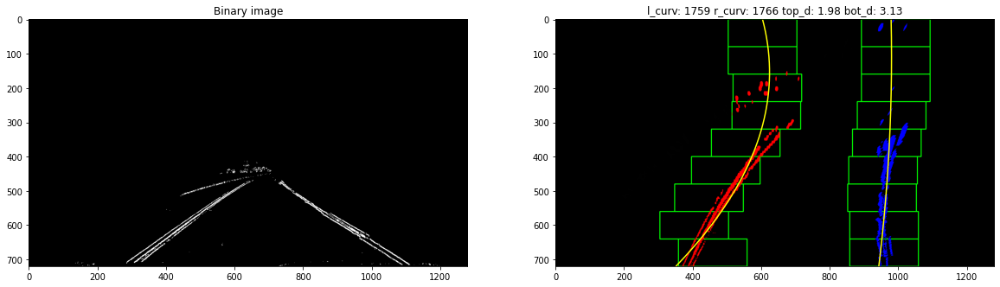

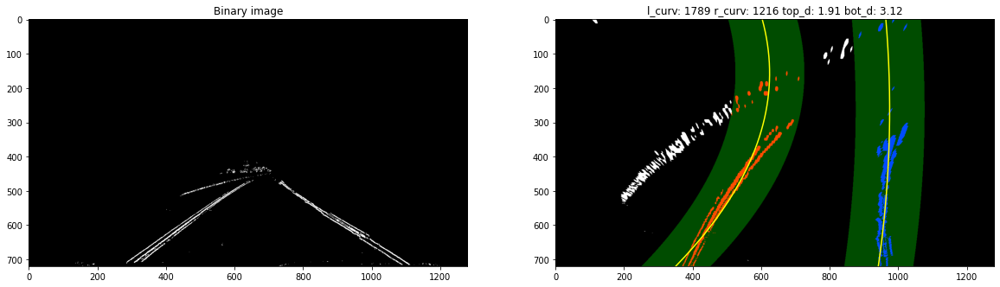

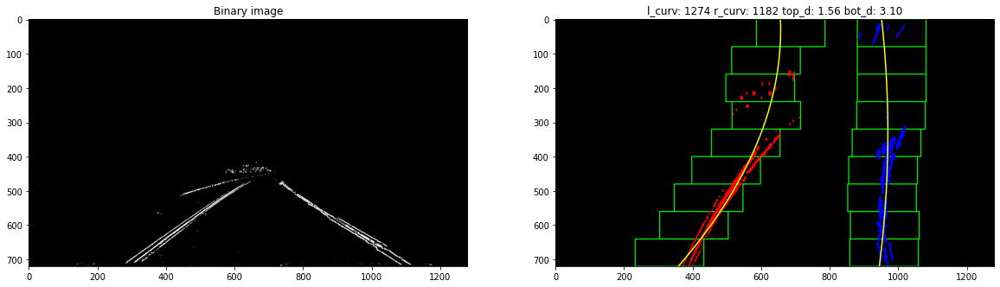

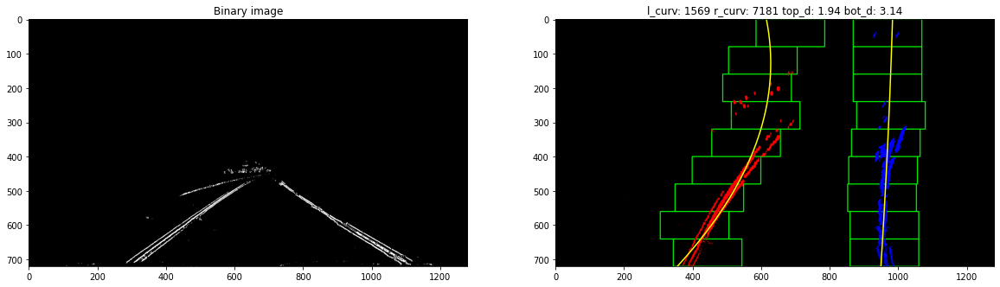

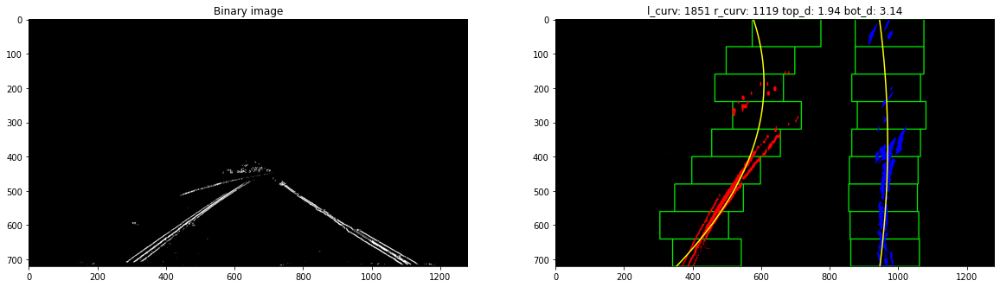

...

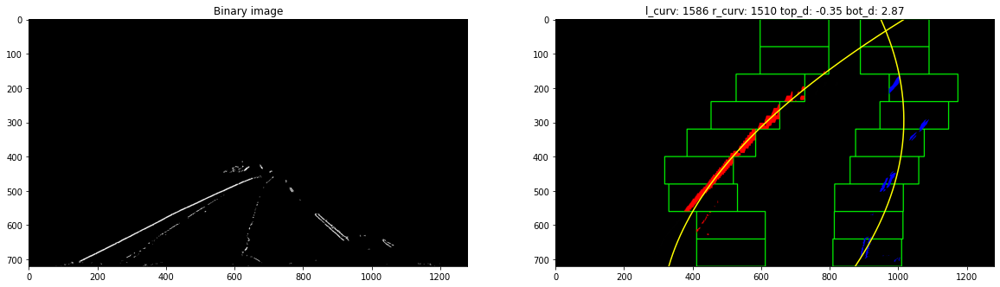

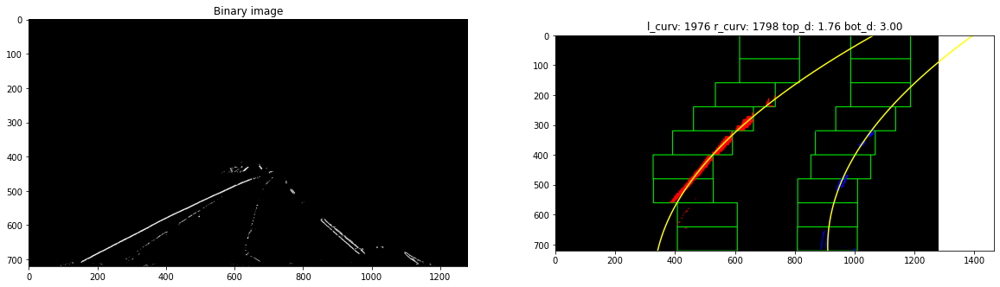

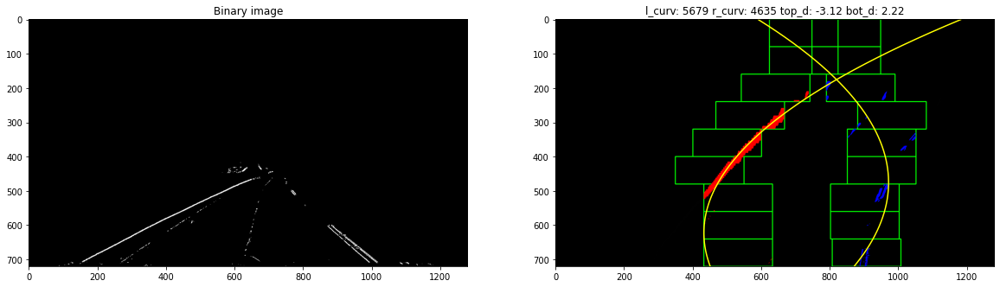

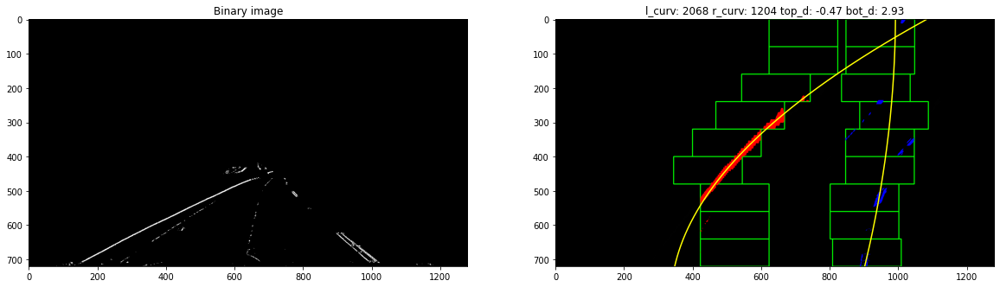

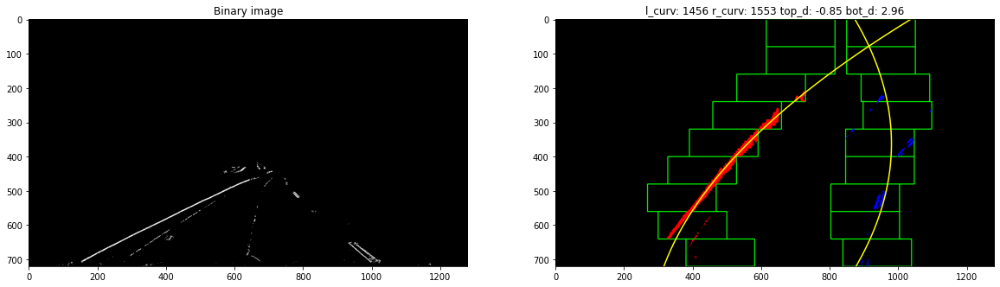

In [581]:
frame = 0
left, right = Line(), Line()

output = 'test_videos_output/challenge_video.mp4'
# clip1 = VideoFileClip("challenge_video.mp4")
clip1 = VideoFileClip("challenge_video.mp4").subclip(0,3)

clip = clip1.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

In [578]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

## Harder challenge video

In [579]:
frame = 0
left, right = Line(), Line()

output = 'test_videos_output/harder_challenge_video.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
# clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(0,5)

clip = clip1.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

t:   0%|          | 2/1199 [00:00<01:02, 19.13it/s, now=None]

Moviepy - Building video test_videos_output/harder_challenge_video.mp4.
Moviepy - Writing video test_videos_output/harder_challenge_video.mp4



t:   1%|          | 10/1199 [00:00<01:48, 10.99it/s, now=None]

frame:  8
radius history mismatch
frame:  9
parallel mismatch
frame:  10
parallel mismatch


t:   1%|          | 12/1199 [00:01<01:48, 10.97it/s, now=None]

frame:  11
parallel mismatch
frame:  12
parallel mismatch


t:   1%|▏         | 16/1199 [00:01<01:51, 10.60it/s, now=None]

frame:  13
parallel mismatch
frame:  14
parallel mismatch
frame:  15
parallel mismatch


t:   2%|▏         | 18/1199 [00:01<01:51, 10.63it/s, now=None]

frame:  16
parallel mismatch
frame:  17
parallel mismatch
frame:  18
parallel mismatch


t:   2%|▏         | 26/1199 [00:02<01:45, 11.09it/s, now=None]

frame:  24
parallel mismatch
frame:  25
parallel mismatch
frame:  26
parallel mismatch


t:   2%|▏         | 28/1199 [00:02<01:48, 10.79it/s, now=None]

frame:  27
parallel mismatch
frame:  28
parallel mismatch
frame:  29
parallel mismatch


t:   3%|▎         | 32/1199 [00:02<01:50, 10.56it/s, now=None]

frame:  30
parallel mismatch
frame:  31
parallel mismatch
frame:  32
parallel mismatch


t:   3%|▎         | 36/1199 [00:03<01:52, 10.32it/s, now=None]

frame:  34
parallel mismatch


t:   3%|▎         | 38/1199 [00:03<01:55, 10.05it/s, now=None]

frame:  36
radius history mismatch
parallel mismatch
frame:  37
radius history mismatch
frame:  38
parallel mismatch


t:   4%|▎         | 42/1199 [00:03<01:50, 10.49it/s, now=None]

frame:  40
parallel mismatch
frame:  42
parallel mismatch


t:   4%|▍         | 46/1199 [00:04<01:53, 10.16it/s, now=None]

frame:  44
parallel mismatch


t:   4%|▍         | 50/1199 [00:04<01:52, 10.23it/s, now=None]

frame:  48
parallel mismatch
frame:  50
parallel mismatch


t:   5%|▍         | 56/1199 [00:05<01:51, 10.27it/s, now=None]

frame:  53
parallel mismatch
frame:  54
parallel mismatch


t:   5%|▍         | 58/1199 [00:05<01:48, 10.48it/s, now=None]

frame:  56
parallel mismatch


t:   5%|▌         | 64/1199 [00:06<01:47, 10.53it/s, now=None]

frame:  61
radius history mismatch
frame:  62
parallel mismatch
frame:  63
parallel mismatch


t:   6%|▌         | 66/1199 [00:06<01:47, 10.55it/s, now=None]

frame:  64
parallel mismatch
frame:  65
parallel mismatch
frame:  66
radius history mismatch
parallel mismatch


t:   6%|▌         | 74/1199 [00:06<01:44, 10.81it/s, now=None]

frame:  71
parallel mismatch
frame:  72
parallel mismatch


t:   7%|▋         | 78/1199 [00:07<01:42, 10.94it/s, now=None]

frame:  76
parallel mismatch
frame:  77
parallel mismatch
frame:  78
parallel mismatch


t:   7%|▋         | 82/1199 [00:07<01:43, 10.81it/s, now=None]

frame:  79
parallel mismatch
frame:  80
parallel mismatch
frame:  81
parallel mismatch


t:   7%|▋         | 84/1199 [00:07<01:45, 10.61it/s, now=None]

frame:  82
parallel mismatch
frame:  83
parallel mismatch


t:   8%|▊         | 90/1199 [00:08<01:44, 10.57it/s, now=None]

frame:  88
parallel mismatch


t:   8%|▊         | 98/1199 [00:09<01:40, 10.98it/s, now=None]

frame:  96
parallel mismatch
frame:  97
parallel mismatch
frame:  98
parallel mismatch


t:   8%|▊         | 100/1199 [00:09<01:42, 10.76it/s, now=None]

frame:  99
parallel mismatch
frame:  100
parallel mismatch
frame:  101
parallel mismatch


t:   9%|▊         | 104/1199 [00:09<01:40, 10.85it/s, now=None]

frame:  102
parallel mismatch
frame:  103
parallel mismatch
frame:  104
parallel mismatch


t:   9%|▉         | 106/1199 [00:09<01:39, 10.94it/s, now=None]

frame:  105
parallel mismatch
frame:  106
parallel mismatch


t:   9%|▉         | 110/1199 [00:10<01:39, 10.92it/s, now=None]

frame:  108
parallel mismatch
frame:  110
parallel mismatch


t:  10%|▉         | 116/1199 [00:10<01:37, 11.09it/s, now=None]

frame:  114
parallel mismatch
frame:  115
parallel mismatch
frame:  116
parallel mismatch


t:  10%|█         | 120/1199 [00:11<01:36, 11.13it/s, now=None]

frame:  117
parallel mismatch
frame:  118
parallel mismatch
frame:  119
parallel mismatch


t:  10%|█         | 122/1199 [00:11<01:38, 10.90it/s, now=None]

frame:  120
parallel mismatch
frame:  121
parallel mismatch
frame:  122
parallel mismatch


t:  11%|█         | 126/1199 [00:11<01:38, 10.92it/s, now=None]

frame:  123
parallel mismatch
frame:  124
parallel mismatch


t:  11%|█         | 128/1199 [00:11<01:39, 10.73it/s, now=None]

frame:  126
parallel mismatch


t:  11%|█         | 132/1199 [00:12<01:40, 10.66it/s, now=None]

frame:  129
parallel mismatch
frame:  130
offset history mismatch
parallel mismatch
frame:  131
offset history mismatch


t:  11%|█         | 134/1199 [00:12<01:39, 10.66it/s, now=None]

frame:  132
offset history mismatch
frame:  133
offset history mismatch
parallel mismatch
frame:  134
offset history mismatch
parallel mismatch


t:  12%|█▏        | 138/1199 [00:12<01:39, 10.71it/s, now=None]

frame:  135
offset history mismatch
parallel mismatch
frame:  136
offset history mismatch
parallel mismatch
frame:  137
offset history mismatch
parallel mismatch


t:  12%|█▏        | 140/1199 [00:13<01:37, 10.82it/s, now=None]

frame:  138
offset history mismatch
parallel mismatch
frame:  139
offset history mismatch
parallel mismatch


t:  12%|█▏        | 144/1199 [00:13<01:38, 10.71it/s, now=None]

frame:  141
radius history mismatch
parallel mismatch
frame:  143


t:  12%|█▏        | 146/1199 [00:13<01:38, 10.71it/s, now=None]

frame:  144
parallel mismatch
frame:  145
parallel mismatch
frame:  146
parallel mismatch


t:  13%|█▎        | 150/1199 [00:14<01:37, 10.78it/s, now=None]

frame:  147
parallel mismatch
frame:  148
parallel mismatch


t:  13%|█▎        | 152/1199 [00:14<01:36, 10.83it/s, now=None]

frame:  150
radius history mismatch
parallel mismatch
frame:  151
parallel mismatch
frame:  152
parallel mismatch


t:  13%|█▎        | 156/1199 [00:14<01:34, 11.01it/s, now=None]

frame:  153
parallel mismatch
frame:  154
parallel mismatch
frame:  155
parallel mismatch


t:  13%|█▎        | 158/1199 [00:14<01:32, 11.25it/s, now=None]

frame:  156
parallel mismatch
frame:  157
parallel mismatch
frame:  158
parallel mismatch


t:  14%|█▎        | 162/1199 [00:15<01:31, 11.33it/s, now=None]

frame:  159
parallel mismatch
frame:  160
parallel mismatch


t:  14%|█▍        | 166/1199 [00:15<01:29, 11.54it/s, now=None]

frame:  163
radius history mismatch
parallel mismatch
frame:  164
radius history mismatch
parallel mismatch
frame:  165
parallel mismatch


t:  14%|█▍        | 168/1199 [00:15<01:29, 11.51it/s, now=None]

frame:  166
parallel mismatch
frame:  167
radius history mismatch
parallel mismatch
frame:  168
parallel mismatch


t:  14%|█▍        | 172/1199 [00:15<01:31, 11.28it/s, now=None]

frame:  169
radius history mismatch
parallel mismatch
frame:  170
radius history mismatch
parallel mismatch
frame:  171
radius history mismatch
parallel mismatch


t:  15%|█▍        | 174/1199 [00:16<01:31, 11.22it/s, now=None]

frame:  172
radius history mismatch
parallel mismatch
frame:  173
radius history mismatch
parallel mismatch


t:  15%|█▍        | 178/1199 [00:16<01:34, 10.85it/s, now=None]

frame:  175
radius history mismatch
parallel mismatch
frame:  176
radius history mismatch
parallel mismatch
frame:  177
radius history mismatch
parallel mismatch


t:  15%|█▌        | 180/1199 [00:16<01:36, 10.51it/s, now=None]

frame:  178
radius history mismatch
parallel mismatch
frame:  179
radius history mismatch
parallel mismatch
frame:  180
parallel mismatch


t:  15%|█▌        | 184/1199 [00:17<01:36, 10.55it/s, now=None]

frame:  181
parallel mismatch
frame:  182
parallel mismatch
frame:  183
parallel mismatch


t:  16%|█▌        | 186/1199 [00:17<01:36, 10.52it/s, now=None]

frame:  184
parallel mismatch
frame:  185
parallel mismatch


t:  16%|█▌        | 188/1199 [00:17<01:35, 10.63it/s, now=None]

frame:  187
parallel mismatch
frame:  188
parallel mismatch


t:  16%|█▌        | 192/1199 [00:17<01:37, 10.36it/s, now=None]

frame:  189
parallel mismatch
frame:  190
parallel mismatch
frame:  191
parallel mismatch


t:  16%|█▌        | 194/1199 [00:18<01:36, 10.46it/s, now=None]

frame:  192
parallel mismatch
frame:  193
parallel mismatch


t:  17%|█▋        | 198/1199 [00:18<01:34, 10.62it/s, now=None]

frame:  197
parallel mismatch
frame:  198
parallel mismatch


t:  17%|█▋        | 204/1199 [00:18<01:33, 10.65it/s, now=None]

frame:  202
parallel mismatch
frame:  203
parallel mismatch


t:  17%|█▋        | 208/1199 [00:19<01:34, 10.50it/s, now=None]

frame:  206
parallel mismatch
frame:  208
parallel mismatch


t:  18%|█▊        | 210/1199 [00:19<01:35, 10.39it/s, now=None]

frame:  209
parallel mismatch
frame:  210
parallel mismatch


t:  18%|█▊        | 216/1199 [00:20<01:39,  9.83it/s, now=None]

frame:  214
parallel mismatch


t:  18%|█▊        | 221/1199 [00:20<01:41,  9.63it/s, now=None]

frame:  219
parallel mismatch
frame:  220
parallel mismatch


t:  19%|█▊        | 223/1199 [00:20<01:42,  9.50it/s, now=None]

frame:  221
parallel mismatch
frame:  222
parallel mismatch


t:  19%|█▊        | 224/1199 [00:21<01:44,  9.35it/s, now=None]

frame:  223
parallel mismatch
frame:  224
parallel mismatch
frame:  225
parallel mismatch


t:  20%|█▉        | 239/1199 [00:22<01:34, 10.15it/s, now=None]

frame:  236


t:  20%|██        | 243/1199 [00:22<01:34, 10.17it/s, now=None]

frame:  241
parallel mismatch


t:  21%|██        | 253/1199 [00:23<01:32, 10.23it/s, now=None]

frame:  252
parallel mismatch


t:  21%|██▏       | 257/1199 [00:24<01:34, 10.01it/s, now=None]

frame:  255
parallel mismatch


t:  22%|██▏       | 261/1199 [00:24<01:30, 10.38it/s, now=None]

frame:  260
parallel mismatch


t:  22%|██▏       | 267/1199 [00:25<01:30, 10.33it/s, now=None]

frame:  265
parallel mismatch
frame:  267
parallel mismatch


t:  22%|██▏       | 269/1199 [00:25<01:30, 10.24it/s, now=None]

frame:  268
parallel mismatch
frame:  269
parallel mismatch
frame:  270
parallel mismatch


t:  23%|██▎       | 273/1199 [00:25<01:31, 10.15it/s, now=None]

frame:  271
parallel mismatch
frame:  272
parallel mismatch
frame:  273
parallel mismatch


t:  23%|██▎       | 279/1199 [00:26<01:25, 10.74it/s, now=None]

frame:  276
parallel mismatch
frame:  277
parallel mismatch
frame:  278
parallel mismatch


t:  23%|██▎       | 281/1199 [00:26<01:24, 10.88it/s, now=None]

frame:  279
parallel mismatch
frame:  280
parallel mismatch
frame:  281
parallel mismatch


t:  24%|██▍       | 285/1199 [00:26<01:22, 11.13it/s, now=None]

frame:  282
parallel mismatch
frame:  283
parallel mismatch
frame:  284
parallel mismatch


t:  24%|██▍       | 287/1199 [00:27<01:22, 11.09it/s, now=None]

frame:  285
parallel mismatch
frame:  286
parallel mismatch


t:  24%|██▍       | 291/1199 [00:27<01:22, 11.05it/s, now=None]

frame:  288
parallel mismatch
frame:  289
parallel mismatch
frame:  290
parallel mismatch


t:  24%|██▍       | 293/1199 [00:27<01:22, 11.00it/s, now=None]

frame:  291
parallel mismatch
frame:  292
parallel mismatch
frame:  293
parallel mismatch


t:  25%|██▍       | 297/1199 [00:28<01:21, 11.07it/s, now=None]

frame:  296
parallel mismatch
frame:  297
parallel mismatch
frame:  298
parallel mismatch


t:  25%|██▌       | 301/1199 [00:28<01:22, 10.91it/s, now=None]

frame:  299
parallel mismatch
frame:  300
parallel mismatch


t:  25%|██▌       | 305/1199 [00:28<01:20, 11.12it/s, now=None]

frame:  303
parallel mismatch


t:  26%|██▌       | 309/1199 [00:29<01:19, 11.18it/s, now=None]

frame:  307
parallel mismatch
frame:  308
parallel mismatch
frame:  309
parallel mismatch


t:  26%|██▌       | 311/1199 [00:29<01:18, 11.25it/s, now=None]

frame:  310
parallel mismatch
frame:  311
parallel mismatch


t:  26%|██▋       | 315/1199 [00:29<01:19, 11.12it/s, now=None]

frame:  313
parallel mismatch
frame:  314
parallel mismatch
frame:  315
parallel mismatch


t:  27%|██▋       | 319/1199 [00:30<01:19, 11.08it/s, now=None]

frame:  316
parallel mismatch
frame:  317
parallel mismatch
frame:  318
parallel mismatch


t:  27%|██▋       | 321/1199 [00:30<01:18, 11.15it/s, now=None]

frame:  319
parallel mismatch
frame:  320
parallel mismatch
frame:  321
parallel mismatch


t:  27%|██▋       | 325/1199 [00:30<01:18, 11.12it/s, now=None]

frame:  322
parallel mismatch
frame:  323
parallel mismatch


t:  27%|██▋       | 327/1199 [00:30<01:18, 11.16it/s, now=None]

frame:  325
parallel mismatch
frame:  326
parallel mismatch
frame:  327
parallel mismatch


t:  28%|██▊       | 331/1199 [00:31<01:18, 11.01it/s, now=None]

frame:  329
parallel mismatch
frame:  330
parallel mismatch
frame:  331
parallel mismatch


t:  28%|██▊       | 335/1199 [00:31<01:19, 10.90it/s, now=None]

frame:  332
parallel mismatch
frame:  333
parallel mismatch
frame:  334
parallel mismatch


t:  28%|██▊       | 337/1199 [00:31<01:18, 11.01it/s, now=None]

frame:  335
parallel mismatch
frame:  336
parallel mismatch
frame:  337
parallel mismatch


t:  28%|██▊       | 341/1199 [00:32<01:18, 10.94it/s, now=None]

frame:  338
parallel mismatch
frame:  339
parallel mismatch


t:  29%|██▉       | 349/1199 [00:32<01:20, 10.50it/s, now=None]

frame:  346
parallel mismatch


t:  29%|██▉       | 351/1199 [00:33<01:20, 10.50it/s, now=None]

frame:  349
parallel mismatch
frame:  350
parallel mismatch
frame:  351
parallel mismatch


t:  30%|██▉       | 355/1199 [00:33<01:19, 10.57it/s, now=None]

frame:  352
parallel mismatch
frame:  353
parallel mismatch
frame:  354
parallel mismatch


t:  30%|██▉       | 357/1199 [00:33<01:18, 10.67it/s, now=None]

frame:  355
parallel mismatch
frame:  356
parallel mismatch
frame:  357
parallel mismatch


t:  30%|███       | 361/1199 [00:33<01:18, 10.72it/s, now=None]

frame:  358
parallel mismatch
frame:  359
parallel mismatch


t:  30%|███       | 365/1199 [00:34<01:16, 10.84it/s, now=None]

frame:  362
parallel mismatch


t:  31%|███       | 373/1199 [00:35<01:21, 10.14it/s, now=None]

frame:  371
parallel mismatch


t:  32%|███▏      | 381/1199 [00:35<01:27,  9.39it/s, now=None]

frame:  379
parallel mismatch


t:  32%|███▏      | 384/1199 [00:36<01:26,  9.44it/s, now=None]

frame:  382
parallel mismatch
frame:  383
parallel mismatch


t:  32%|███▏      | 388/1199 [00:36<01:26,  9.43it/s, now=None]

frame:  386
parallel mismatch
frame:  387
parallel mismatch


t:  33%|███▎      | 393/1199 [00:37<01:31,  8.83it/s, now=None]

frame:  391
parallel mismatch


t:  33%|███▎      | 396/1199 [00:37<01:32,  8.69it/s, now=None]

frame:  394
parallel mismatch


t:  34%|███▍      | 408/1199 [00:38<01:21,  9.71it/s, now=None]

frame:  406
parallel mismatch


t:  34%|███▍      | 413/1199 [00:39<01:20,  9.73it/s, now=None]

frame:  411
parallel mismatch


t:  35%|███▍      | 418/1199 [00:39<01:20,  9.74it/s, now=None]

frame:  417
parallel mismatch
frame:  418
parallel mismatch


t:  35%|███▌      | 422/1199 [00:40<01:20,  9.62it/s, now=None]

frame:  420
radius history mismatch
frame:  421
radius history mismatch
parallel mismatch


t:  35%|███▌      | 424/1199 [00:40<01:19,  9.69it/s, now=None]

frame:  422
parallel mismatch
frame:  423
parallel mismatch


t:  36%|███▌      | 427/1199 [00:40<01:17,  9.95it/s, now=None]

frame:  424
parallel mismatch
frame:  426
parallel mismatch


t:  36%|███▌      | 429/1199 [00:41<01:15, 10.18it/s, now=None]

frame:  427
parallel mismatch
frame:  428
parallel mismatch


t:  36%|███▌      | 431/1199 [00:41<01:16, 10.10it/s, now=None]

frame:  430
parallel mismatch
frame:  431
frame:  432


t:  36%|███▋      | 435/1199 [00:41<01:15, 10.07it/s, now=None]

frame:  434
parallel mismatch
frame:  436
parallel mismatch


t:  37%|███▋      | 439/1199 [00:41<01:13, 10.32it/s, now=None]

frame:  437


t:  38%|███▊      | 459/1199 [00:43<01:06, 11.20it/s, now=None]

frame:  456
frame:  457
parallel mismatch


t:  38%|███▊      | 461/1199 [00:44<01:08, 10.74it/s, now=None]

frame:  459
parallel mismatch


t:  39%|███▉      | 465/1199 [00:44<01:08, 10.65it/s, now=None]

frame:  464
parallel mismatch


t:  40%|███▉      | 479/1199 [00:45<01:06, 10.88it/s, now=None]

frame:  477
parallel mismatch
frame:  479
parallel mismatch


t:  40%|████      | 483/1199 [00:46<01:05, 10.94it/s, now=None]

frame:  480
parallel mismatch
frame:  481
parallel mismatch
frame:  482
parallel mismatch


t:  40%|████      | 485/1199 [00:46<01:05, 10.91it/s, now=None]

frame:  483
parallel mismatch
frame:  484
parallel mismatch
frame:  485
parallel mismatch


t:  41%|████      | 487/1199 [00:46<01:04, 11.06it/s, now=None]

frame:  486
parallel mismatch
frame:  487
parallel mismatch
frame:  488
parallel mismatch


t:  41%|████      | 491/1199 [00:46<01:04, 10.91it/s, now=None]

frame:  489
parallel mismatch
frame:  491
parallel mismatch


t:  41%|████▏     | 495/1199 [00:47<01:03, 11.00it/s, now=None]

frame:  492
parallel mismatch
frame:  493
parallel mismatch
frame:  494
parallel mismatch


t:  41%|████▏     | 497/1199 [00:47<01:04, 10.95it/s, now=None]

frame:  495
parallel mismatch
frame:  496
parallel mismatch
frame:  497
parallel mismatch


t:  42%|████▏     | 501/1199 [00:47<01:03, 10.95it/s, now=None]

frame:  498
parallel mismatch
frame:  499
parallel mismatch
frame:  500


t:  42%|████▏     | 503/1199 [00:47<01:04, 10.75it/s, now=None]

frame:  501
frame:  503
parallel mismatch


t:  42%|████▏     | 505/1199 [00:48<01:03, 10.86it/s, now=None]

frame:  504
frame:  505
parallel mismatch
frame:  506
parallel mismatch


t:  42%|████▏     | 509/1199 [00:48<01:03, 10.90it/s, now=None]

frame:  507
parallel mismatch
frame:  508
parallel mismatch
frame:  509
parallel mismatch


t:  43%|████▎     | 513/1199 [00:48<01:00, 11.25it/s, now=None]

frame:  510
parallel mismatch
frame:  511
frame:  512
parallel mismatch


t:  43%|████▎     | 515/1199 [00:48<00:59, 11.48it/s, now=None]

frame:  513
parallel mismatch
frame:  515
parallel mismatch


t:  43%|████▎     | 519/1199 [00:49<01:01, 11.13it/s, now=None]

frame:  516
parallel mismatch
frame:  517
parallel mismatch
frame:  518
parallel mismatch


t:  43%|████▎     | 521/1199 [00:49<01:00, 11.18it/s, now=None]

frame:  519
parallel mismatch
frame:  520
parallel mismatch
frame:  521
parallel mismatch


t:  44%|████▍     | 525/1199 [00:49<00:59, 11.24it/s, now=None]

frame:  522
parallel mismatch
frame:  523
parallel mismatch
frame:  524
parallel mismatch


t:  44%|████▍     | 527/1199 [00:50<01:00, 11.06it/s, now=None]

frame:  525
parallel mismatch


t:  44%|████▍     | 533/1199 [00:50<00:59, 11.20it/s, now=None]

frame:  530
parallel mismatch
frame:  531
parallel mismatch
frame:  532
parallel mismatch


t:  45%|████▍     | 535/1199 [00:50<00:58, 11.26it/s, now=None]

frame:  533
parallel mismatch
frame:  534
parallel mismatch
frame:  535
parallel mismatch


t:  45%|████▍     | 539/1199 [00:51<00:58, 11.25it/s, now=None]

frame:  536
parallel mismatch
frame:  537
parallel mismatch
frame:  538
parallel mismatch


t:  45%|████▌     | 541/1199 [00:51<00:58, 11.26it/s, now=None]

frame:  539
parallel mismatch
frame:  540
parallel mismatch


t:  45%|████▌     | 545/1199 [00:51<00:58, 11.22it/s, now=None]

frame:  542
offset history mismatch
frame:  543
offset history mismatch
parallel mismatch
frame:  544
offset history mismatch
parallel mismatch


t:  46%|████▌     | 547/1199 [00:51<00:59, 11.01it/s, now=None]

frame:  545
offset history mismatch
parallel mismatch
frame:  546
offset history mismatch
parallel mismatch
frame:  547
offset history mismatch
parallel mismatch


t:  46%|████▌     | 551/1199 [00:52<00:57, 11.26it/s, now=None]

frame:  548
offset history mismatch
parallel mismatch
frame:  549
offset history mismatch
parallel mismatch
frame:  550
offset history mismatch
parallel mismatch


t:  46%|████▌     | 553/1199 [00:52<00:57, 11.21it/s, now=None]

frame:  551
offset history mismatch
parallel mismatch
frame:  552
offset history mismatch


t:  46%|████▋     | 557/1199 [00:52<00:56, 11.39it/s, now=None]

frame:  555
radius history mismatch
parallel mismatch
frame:  556
parallel mismatch
frame:  557
parallel mismatch


t:  47%|████▋     | 561/1199 [00:53<00:56, 11.39it/s, now=None]

frame:  558
parallel mismatch
frame:  559
parallel mismatch


TypeError: expected non-empty vector for x

t:  47%|████▋     | 561/1199 [01:12<00:56, 11.39it/s, now=None]

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))